### 1) Import libraries/ Dipendancies -

In [3]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.express as ex
import matplotlib

from scipy.stats import zscore,mode
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,StratifiedKFold,cross_val_score
from sklearn.metrics import precision_score,recall_score,confusion_matrix,precision_recall_curve
from sklearn.metrics import accuracy_score,classification_report,f1_score,roc_curve
from sklearn.preprocessing import StandardScaler,OneHotEncoder,OrdinalEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings("ignore")

from IPython.display import display
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
%matplotlib inline

import pandas_profiling
import ydata_profiling

import json
import pickle

### 2) Data Gathering and Data Validitation - 

In [ ]:
# Recieved data according to Schema file and got the data.
# for DQ check we have used Microsoft Excel

In [5]:
df = pd.read_csv("credit_risk_dataset.csv")
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


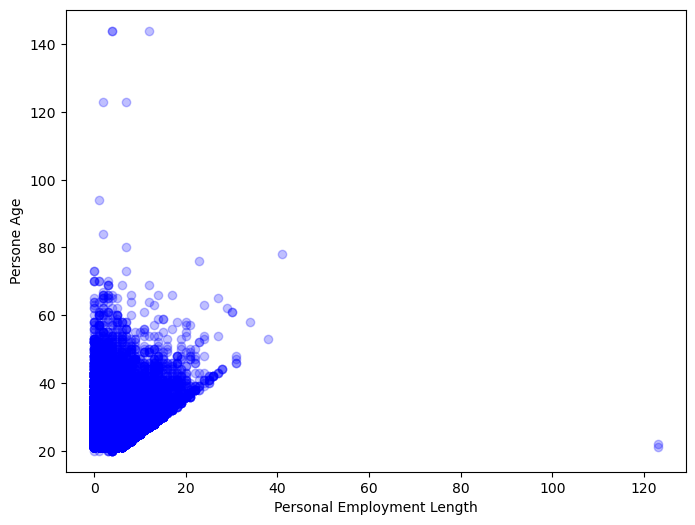

In [6]:
# plots a scatter plot of income against age
plt.figure(figsize=(8, 6))

plt.scatter(df['person_emp_length'], df['person_age'], color='blue', alpha=0.25)
plt.xlabel('Personal Employment Length')
plt.ylabel('Persone Age')

plt.ticklabel_format(useOffset=False, style='plain')

plt.show()
# Here we can see the higher correlation between age and income as they are may working from long time in the company
# we can also see the outliers in the data

In [7]:
indices = df[df["person_emp_length"] > 60].index
indices
# on the indices 0 and 210 there are ahe outliers so after discussion with buisness experties will remove those.

Int64Index([0, 210], dtype='int64')

In [7]:
# length of records where outliers are present 
len(indices)

2

In [8]:
# Checking for which records will be dropped
df.loc[[0,210]]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
210,21,192000,MORTGAGE,123.0,VENTURE,A,20000,6.54,0,0.10,N,4


In [9]:
# Dropping the records based on the indices
df_1 = df.drop([0,210],axis=0)
df_1.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


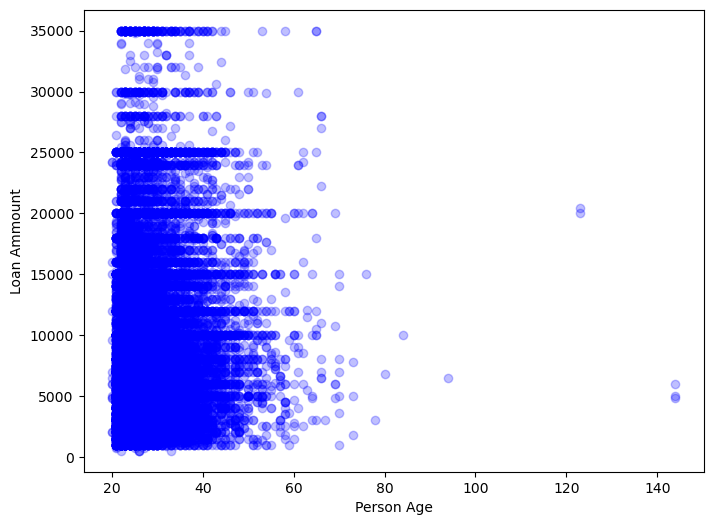

In [55]:
# we can say that no one can apply for loan after age of 100 so we have to check for those outliers too.
# we found out entries who applied for loan after age of 100
plt.figure(figsize=(8,6))
plt.scatter(df_1["person_age"],df_1["loan_amnt"],color = "blue",alpha=0.25)
plt.xlabel("Person Age")
plt.ylabel("Loan Ammount")
plt.show()

In [10]:
# we are dropping those Entries from df and creating new df
indices = df_1[df_1["person_age"] > 100].index
indices

Int64Index([81, 183, 575, 747, 32297], dtype='int64')

In [11]:
df_2 = df_1.drop([81, 183, 575, 747, 32297],axis=0)
df_2.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


### 3) EDA (Exploratory Data Analysis) - 

In [ ]:
Steps Involved in EDA - 
    1) Information about Datset
    2) Describe Dataset
    3) Find Missing Values / Percentage of Missing Values
    4) Value Counts of Each Object Feature
    4) Desciding Encoding Types
    5) Outliers Detection
    6) Correlation with Target Feature
    7) VIF (Variance Inflation Factor)
    8) Status of Target Feature
    9) EDA report

- Information about Datset

In [12]:
# Here we have got basic information about data like non null count, memory usage and Data type of Features
df_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32574 non-null  int64  
 1   person_income               32574 non-null  int64  
 2   person_home_ownership       32574 non-null  object 
 3   person_emp_length           31679 non-null  float64
 4   loan_intent                 32574 non-null  object 
 5   loan_grade                  32574 non-null  object 
 6   loan_amnt                   32574 non-null  int64  
 7   loan_int_rate               29459 non-null  float64
 8   loan_status                 32574 non-null  int64  
 9   loan_percent_income         32574 non-null  float64
 10  cb_person_default_on_file   32574 non-null  object 
 11  cb_person_cred_hist_length  32574 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.2+ MB


- Describe Dataset

In [13]:
# Here we are printing Description of dataset and got all the stats.
df_2.describe().T

,count,mean,std,min,25%,50%,75%,max
person_age,32574.0,27.718426,6.204987,20.00,23.00,26.00,30.00,94.00
person_income,32574.0,65878.480813,52531.938809,4000.00,38500.00,55000.00,79200.00,2039784.00
person_emp_length,31679.0,4.782064,4.034948,0.00,2.00,4.00,7.00,41.00
loan_amnt,32574.0,9588.018051,6320.249598,500.00,5000.00,8000.00,12200.00,35000.00
loan_int_rate,29459.0,11.011529,3.240497,5.42,7.90,10.99,13.47,23.22
loan_status,32574.0,0.218180,0.413017,0.00,0.00,0.00,0.00,1.00
loan_percent_income,32574.0,0.170202,0.106755,0.00,0.09,0.15,0.23,0.83
cb_person_cred_hist_length,32574.0,5.804108,4.053873,2.00,3.00,4.00,8.00,30.00


- Find Missing Values / Percentage of Missing Values

In [14]:
# Count of Missing Values in Each Numerical Feature, 
# There are Missing values in person_emp_length and loan_int_rate features.
df_2.isna().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3115
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [15]:
# Percentage of Missing Values in Each Numerical Feature
# There are 2.74 % Missing vales in person_emp_length feature and 9.56 % in loan_int_rate Feature
df_2.isna().mean() * 100

person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
person_emp_length             2.747590
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_int_rate                 9.562842
loan_status                   0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
dtype: float64

- Value Counts of Each Object Feature

In [16]:
# Here we are checking for the Value counts of each Object datatype features.Targetting 4 Object Datatype 
# feature which are person_home_ownership,loan_intent,loan_grade and cb_person_default_on_file
cols = df_2.select_dtypes(include="object").columns.to_list()
for feature in cols:
    print("Column Name - ",feature)
    print(df[feature].value_counts().sort_values(ascending=False))
    print()

Column Name -  person_home_ownership
RENT        16446
MORTGAGE    13444
OWN          2584
OTHER         107
Name: person_home_ownership, dtype: int64

Column Name -  loan_intent
EDUCATION            6453
MEDICAL              6071
VENTURE              5719
PERSONAL             5521
DEBTCONSOLIDATION    5212
HOMEIMPROVEMENT      3605
Name: loan_intent, dtype: int64

Column Name -  loan_grade
A    10777
B    10451
C     6458
D     3626
E      964
F      241
G       64
Name: loan_grade, dtype: int64

Column Name -  cb_person_default_on_file
N    26836
Y     5745
Name: cb_person_default_on_file, dtype: int64



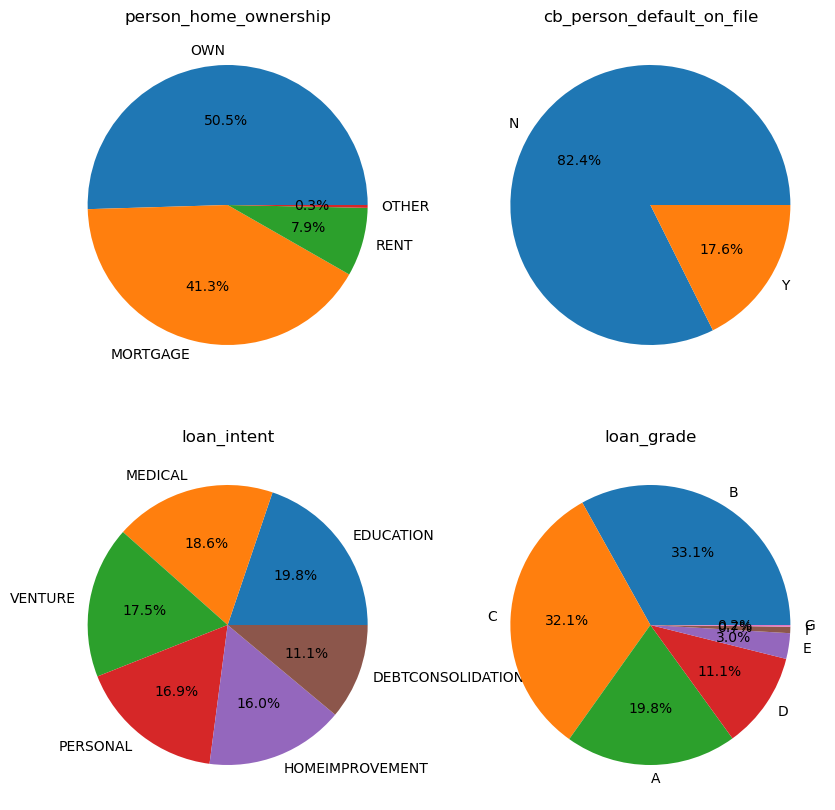

In [66]:
# Pie plot of Value counts in the feature Person_home_ownership,loan_intent,cb_person_default_on_file and loan_grade
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
line1 = plt.pie(df_2["person_home_ownership"].value_counts(),labels = df_2["person_home_ownership"].unique(),autopct="%1.1f%%")
plt.title('person_home_ownership')
ax1 = fig.add_subplot(223)
line2 = plt.pie(df_2["loan_intent"].value_counts(),labels = df_2["loan_intent"].unique(),autopct="%1.1f%%")
plt.title('loan_intent')
ax1 = fig.add_subplot(222)
line3 = plt.pie(df_2["cb_person_default_on_file"].value_counts(),labels = df_2["cb_person_default_on_file"].unique()
                ,autopct="%1.1f%%")
plt.title('cb_person_default_on_file')
ax1 = fig.add_subplot(224)
line4 = plt.pie(df_2["loan_grade"].value_counts(),labels = df_2["loan_grade"].unique(),autopct="%1.1f%%")
plt.title('loan_grade')
plt.show()

In [17]:
ex.pie(df_2,names='person_home_ownership',title='person_home_ownership',hole=0.33)

In [18]:
ex.pie(df_2,names='loan_intent',title='loan_intent',hole=0.33)

In [19]:
ex.pie(df_2,names='cb_person_default_on_file',title='Propotion Of CB Person Default On File',hole=0.33)

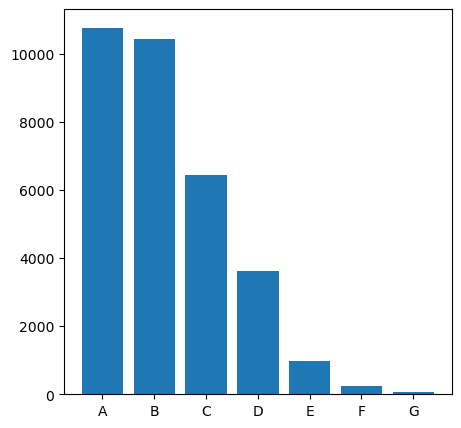

In [20]:
# bar graph of Value counts in the feature loan-grade
dict1 = df_2["loan_grade"].value_counts().to_dict()
x1 = list(dict1.keys())
y1 = list(dict1.values())
plt.figure(figsize=(5,5))
plt.bar(x1,y1)
plt.show()

- Desciding Encoding Types

In [21]:
# Checking for any sequence is the object columns so we can select encoding techniques.
cols = df_2.select_dtypes(include="object").columns.to_list()
for feature in cols:
    print("Column Name - ",feature)
    print(df_2[feature].unique())
    print()

Column Name -  person_home_ownership
['OWN' 'MORTGAGE' 'RENT' 'OTHER']

Column Name -  loan_intent
['EDUCATION' 'MEDICAL' 'VENTURE' 'PERSONAL' 'HOMEIMPROVEMENT'
 'DEBTCONSOLIDATION']

Column Name -  loan_grade
['B' 'C' 'A' 'D' 'E' 'F' 'G']

Column Name -  cb_person_default_on_file
['N' 'Y']



In [22]:
# Here we can clearely see there is no any precedence or sequence in the person_home_ownership, 
# loan_intent and loan_grade Features so we have to use either get_dummies() or OneHotEncoding Technique.

Features for OneHotEncoding / Get Dummies - person_home_ownership, loan_intent, loan_grade

In [ ]:
# Here we can clearely see there is precedence or sequence in the cb_person_default_on_file
# Feature so we have to use either replace() or Ordinal Encoding Technique.

Features for OrdinalEncoding / replace - cb_person_default_on_file

In [ ]:
# As there are numerical values in the loan_status feature i.e Target Feature so we doesnt require 
# need of Label Encoding Technique

- Outliers Detection

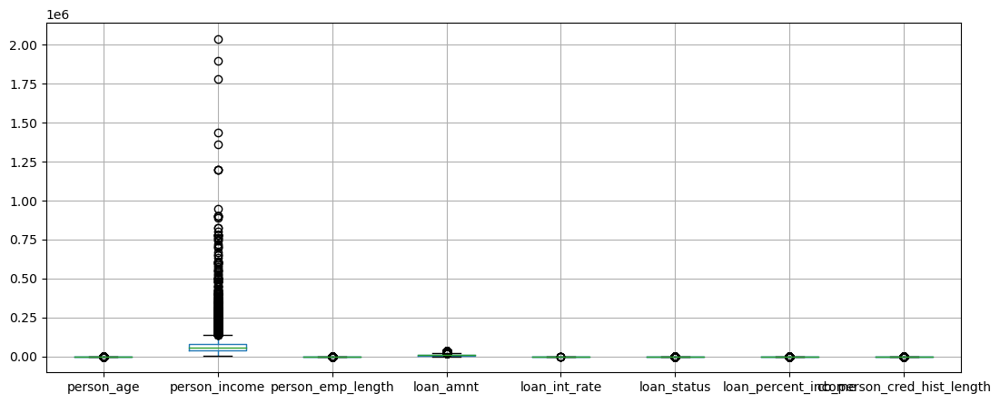

In [24]:
# Here we can see there ae outliers in the every feature
plt.figure(figsize=(13,5))
df_2.boxplot()
plt.show()

<AxesSubplot:xlabel='person_age'>

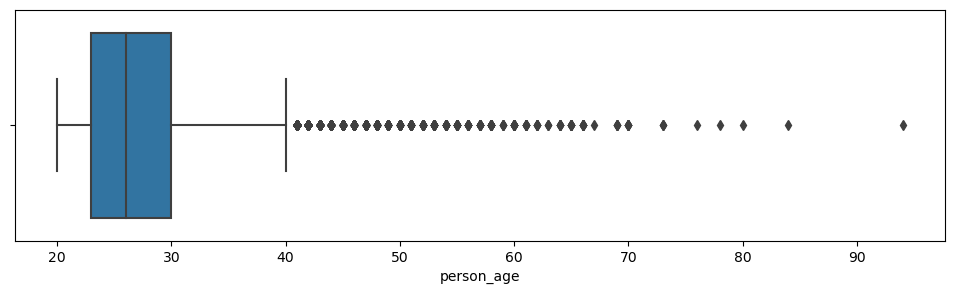

In [25]:
# Checking of outliers in person_age Feature
plt.figure(figsize=(12,3))
sns.boxplot(df_2["person_age"])
# here we can say practically age more than 120 is not possibole so those are outliers.

In [26]:
# Count of outliers in person_age by using Z-score method
z = zscore(df_2["person_age"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in person_age - {len(z1)}")

Count of Outliers in person_age - 553


<AxesSubplot:xlabel='person_income'>

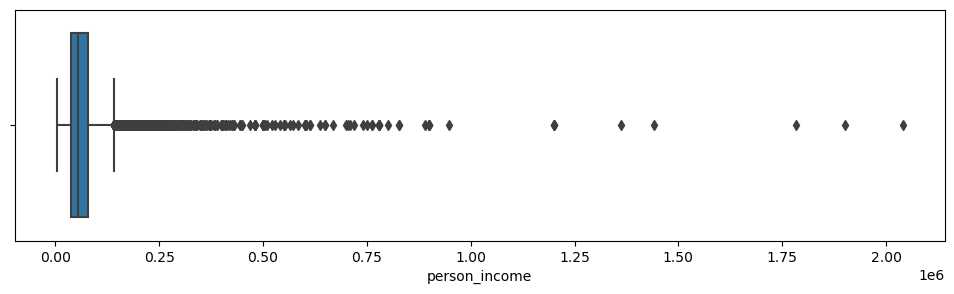

In [27]:
# Checking of outliers in person_income Feature, we can see there is one extreme outlier
# we are not considering 558 are outliers because person can live upto 120 years.
plt.figure(figsize=(12,3))
sns.boxplot(df_2["person_income"])

In [28]:
# Count of outliers in person_income by using Z-score method
z = zscore(df_2["person_income"]).to_list()
z2 = []
for i in z:
    if i > 3 or i <-3:
        z2.append(i)
print(f"Count of Outliers in person_income - {len(z2)}")

Count of Outliers in person_income - 355


In [29]:
# Count of Outliers using iqr method to crosscheck the above result.
q1 = df_2["person_income"].quantile(0.25)
q3 = df_2["person_income"].quantile(0.75)
iqr = q3 - q1
upper_tail = q3 + 1.5 * iqr
lower_tail = q1 - 1.5 * iqr
print(f"Upper tail - {upper_tail}\nLower tail - {lower_tail}")
count = df_2.loc[(df_2["person_income"] > upper_tail) | (df_2["person_income"] < lower_tail)].shape[0]
print(f"Count of Outliers in person_income - {count}")

Upper tail - 140250.0
Lower tail - -22550.0
Count of Outliers in person_income - 1480


<AxesSubplot:xlabel='person_emp_length'>

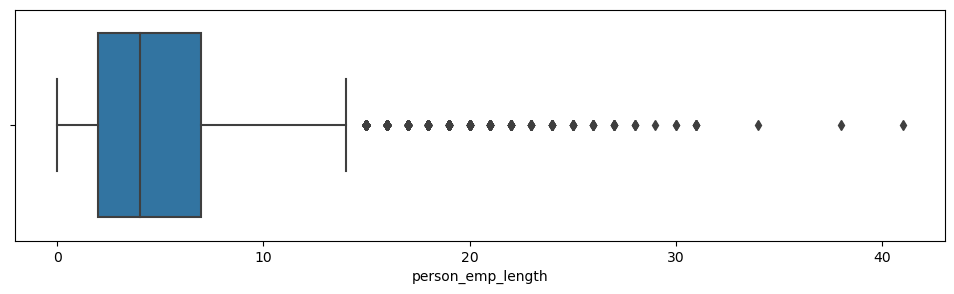

In [30]:
# Checking of outliers in person_emp_length Feature,we can see there is one extreme outlier.
plt.figure(figsize=(12,3))
sns.boxplot(df_2["person_emp_length"])

In [31]:
# Count of outliers in person_emp_length by using Z-score method, here z-score is showing
z = zscore(df_2["person_emp_length"]).to_list()
z1 = []
for i in z:
    if i > 3 or i < -3:
        z1.append(i)
print(f"Count of Outliers in person_emp_length - {len(z1)}")

Count of Outliers in person_emp_length - 0


In [32]:
# Count of Outliers using iqr method to crosscheck the above result.
q1 = df_2["person_emp_length"].quantile(0.25)
q3 = df_2["person_emp_length"].quantile(0.75)
iqr = q3 - q1
upper_tail = q3 + 1.5 * iqr
lower_tail = q1 - 1.5 * iqr
print(f"Upper tail - {upper_tail}\nLower tail - {lower_tail}")
count = df_2.loc[(df_2["person_emp_length"] > upper_tail) | (df_2["person_emp_length"] < lower_tail)].shape[0]
print(f"Count of Outliers in person_emp_length - {count}")

Upper tail - 14.5
Lower tail - -5.5
Count of Outliers in person_emp_length - 851


<AxesSubplot:xlabel='loan_amnt'>

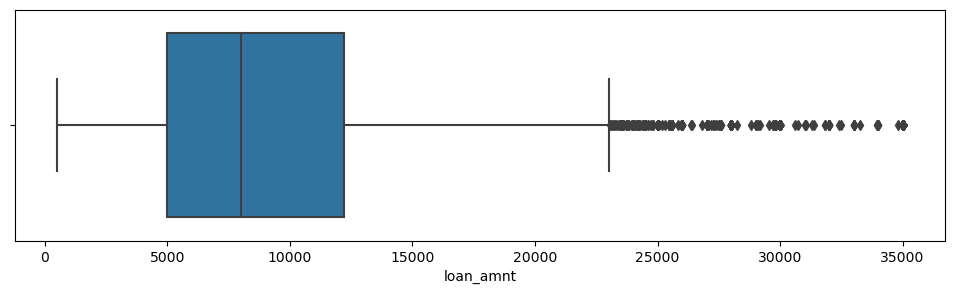

In [33]:
# Checking of outliers in loan_amnt Feature
plt.figure(figsize=(12,3))
sns.boxplot(df_2["loan_amnt"])

In [34]:
# Count of outliers in loan_amnt by using Z-score method
z = zscore(df_2["loan_amnt"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in loan_amnt - {len(z1)}")

Count of Outliers in loan_amnt - 336


<AxesSubplot:xlabel='loan_int_rate'>

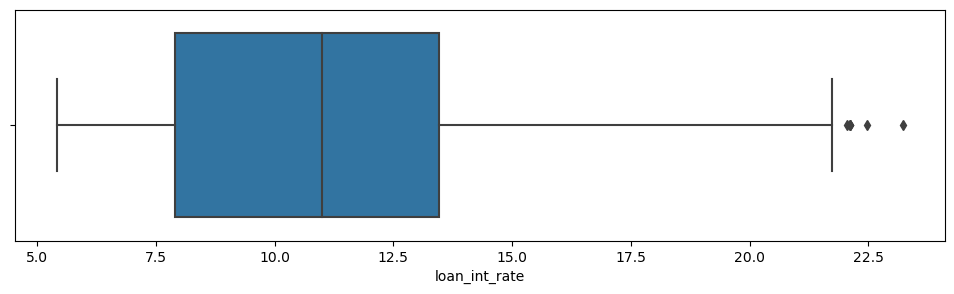

In [35]:
# Checking of outliers in loan_int_rate Feature, Too few outliers in data.
plt.figure(figsize=(12,3))
sns.boxplot(df_2["loan_int_rate"])

In [36]:
# Count of outliers in loan_int_rate by using Z-score method
z = zscore(df_2["loan_int_rate"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in loan_int_rate - {len(z1)}")

Count of Outliers in loan_int_rate - 0


In [37]:
# Count of Outliers using iqr method to crosscheck the above result.
q1 = df_2["loan_int_rate"].quantile(0.25)
q3 = df_2["loan_int_rate"].quantile(0.75)
iqr = q3 - q1
upper_tail = q3 + 1.5 * iqr
lower_tail = q1 - 1.5 * iqr
print(f"Upper tail - {upper_tail}\nLower tail - {lower_tail}")
count = df_2.loc[(df_2["loan_int_rate"] > upper_tail) | (df_2["loan_int_rate"] < lower_tail)].shape[0]
print(f"Count of Outliers in person_income - {count}")

Upper tail - 21.825000000000003
Lower tail - -0.45500000000000007
Count of Outliers in person_income - 6


<AxesSubplot:xlabel='loan_percent_income'>

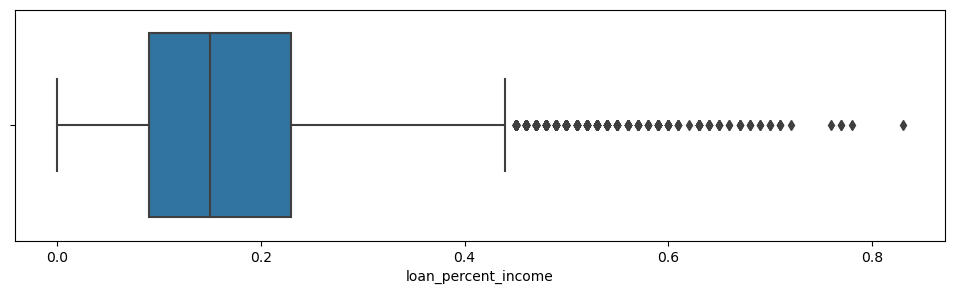

In [38]:
# Checking of outliers in loan_percent_income Feature
plt.figure(figsize=(12,3))
sns.boxplot(df_2["loan_percent_income"])

In [39]:
# Count of outliers in loan_percent_income by using Z-score method
z = zscore(df_2["loan_percent_income"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in loan_percent_income - {len(z1)}")

Count of Outliers in loan_percent_income - 335


<AxesSubplot:xlabel='cb_person_cred_hist_length'>

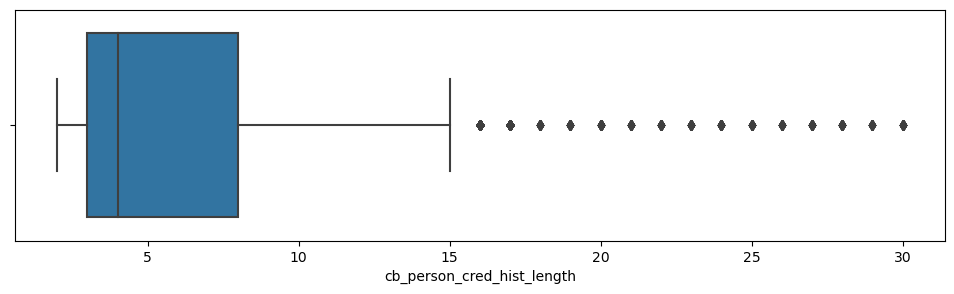

In [42]:
# Checking of outliers in cb_person_cred_hist_length Feature
plt.figure(figsize=(12,3))
sns.boxplot(df_2["cb_person_cred_hist_length"])

In [43]:
# Count of outliers in cb_person_cred_hist_length by using Z-score method
z = zscore(df_2["cb_person_cred_hist_length"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in cb_person_cred_hist_length - {len(z1)}")

Count of Outliers in cb_person_cred_hist_length - 283


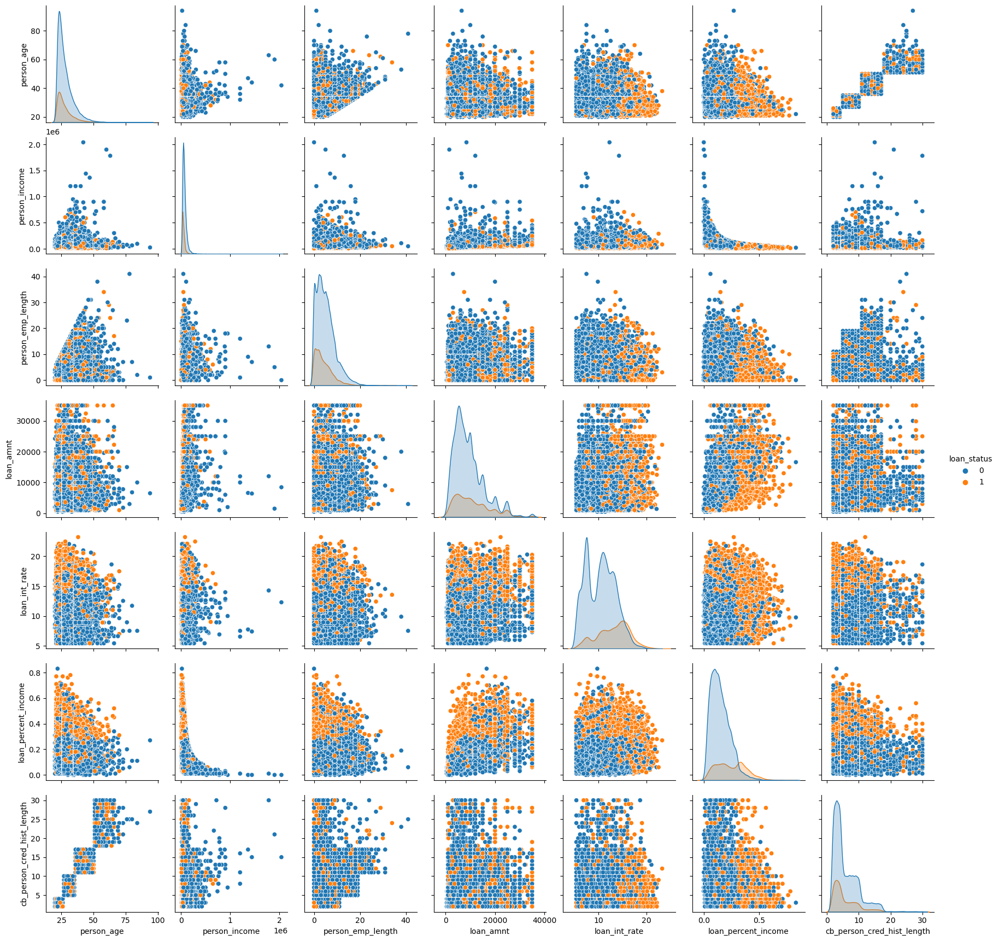

In [44]:
# Pairplot for Distribution
sns.pairplot(df_2,hue="loan_status")

- Correlation with Target Feature

In [45]:
# Checking for Relation of independent feature with dependent features and and we are not getting good correlation.
df_2.corr()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.140497,0.172554,0.051751,0.011966,-0.020687,-0.041587,0.878094
person_income,0.140497,1.000000,0.154746,0.317497,-0.001121,-0.168485,-0.294558,0.123049
person_emp_length,0.172554,0.154746,1.000000,0.110993,-0.058263,-0.085966,-0.058559,0.149404
loan_amnt,0.051751,0.317497,0.110993,1.000000,0.146803,0.105240,0.572420,0.042240
loan_int_rate,0.011966,-0.001121,-0.058263,0.146803,1.000000,0.335092,0.120218,0.016656
loan_status,-0.020687,-0.168485,-0.085966,0.105240,0.335092,1.000000,0.379250,-0.015472
loan_percent_income,-0.041587,-0.294558,-0.058559,0.572420,0.120218,0.379250,1.000000,-0.031447
cb_person_cred_hist_length,0.878094,0.123049,0.149404,0.042240,0.016656,-0.015472,-0.031447,1.000000


In [47]:
df2 = df_2.corr().iloc[5,:].to_frame().T
df2

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
loan_status,-0.020687,-0.168485,-0.085966,0.10524,0.335092,1.0,0.37925,-0.015472


<AxesSubplot:>

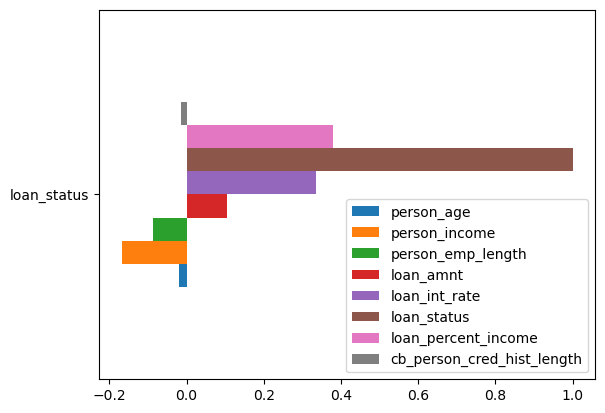

In [48]:
# bar plot of correlation of Loans status feature with respect to all independent features. 
df2.plot(kind="barh")

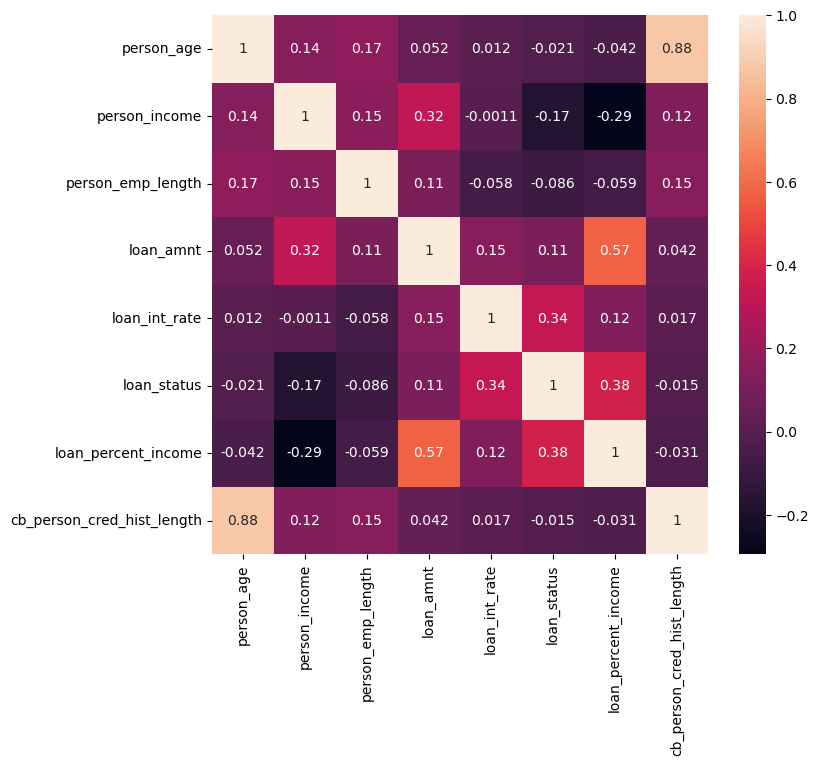

In [49]:
# Heatmap for correlation Values
plt.figure(figsize=(8,7))
sns.heatmap(df_2.corr(),annot=True)
plt.show()

- VIF (Variance Inflation Factor)

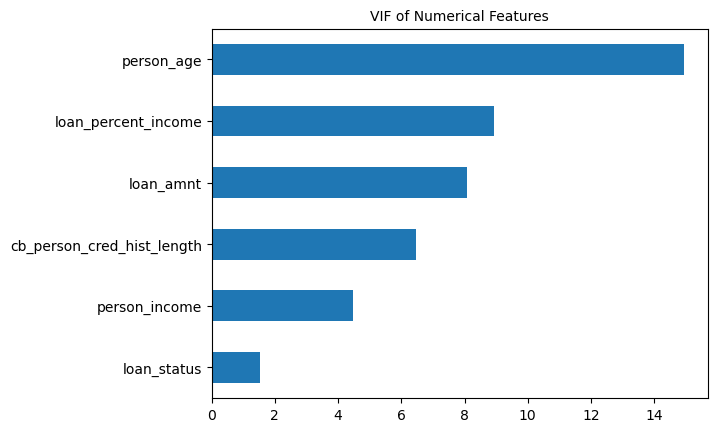

In [50]:
# Checking for relation between independent features. Here im dropping Features having null values
x = df_2.select_dtypes(exclude="object").drop(["loan_int_rate","person_emp_length"],axis=1)
vif_list = []
for i in range(x.shape[1]):
    vif = variance_inflation_factor(x.to_numpy(),i)
    vif_list.append(vif)
x1 = pd.Series(vif_list,index=x.columns)
x1.sort_values().plot(kind="barh")
plt.title("VIF of Numerical Features",fontsize=10)
plt.show()

### - Status of Target Feature

In [ ]:
# First of all We dont require label encoding beacuse target column is actually in numerical datatype.

In [51]:
df_2["loan_status"].value_counts()

0    25467
1     7107
Name: loan_status, dtype: int64

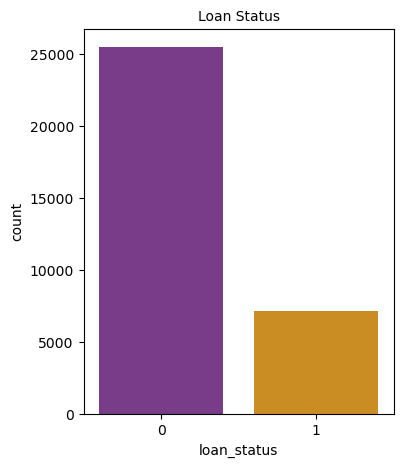

In [52]:
plt.figure(figsize=(4,5))
sns.countplot(df_2["loan_status"], palette='CMRmap')
plt.title("Loan Status",fontsize=10)
plt.show()

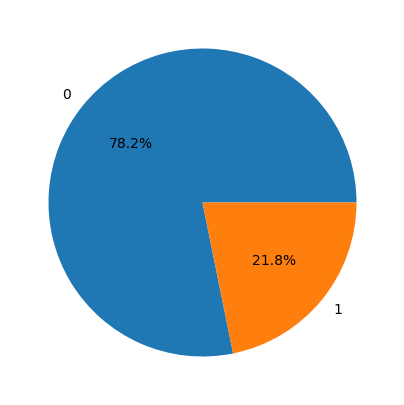

In [53]:
plt.figure(figsize=(5,5))
plt.pie(df_2["loan_status"].value_counts(),labels=df_2["loan_status"].unique()
        ,autopct="%1.1f%%")
plt.show()

In [ ]:
# so here we also got to know that there is bias in the categories so we have to perform sampling on it.
# Major category contains 78.2 percent of data and minor category contains 21.8 per data.

- EDA Report using Pandas Profilling

In [140]:
pf = pandas_profiling.ProfileReport(df_2)
pf.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
pf.to_file("EDA Report.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 4) Making Hypothesis for Testing

#### person_age -                 

1) More defaults for the younger peoples

#### person_income -

1) People who defult have less income than people who have not default

#### person_home_ownership -

1) Mortgage have more cases of default followed by rent and own

#### person_emp_length - 

1) There are fewer people of default after long employment term

#### loan_intent -

1) There are more cases of default for personal intent which is followed by educational ,home improvment, medical etc.

2) least cases of default for venture

#### loan_grade -

1) The higher the grade there are fewer cases of default

#### loan_amnt -

1) Median of ammount for non default is lower than median for default.

#### loan_int_rate - 

1) Higher the intrest rate there high defaults.

#### loan_percent_income -

1) People who allocate higher percentage of income to the loan tend to default more than people who allocate less.

#### cb_person_default_on_file - 

1) There are more cases of default those have default on file

#### cb_person_cred_hist_length -

1) There are fewer cases of default those have higher credit history length.

## Hypothesis Testing

### Univariate Analysis -

#### Target Variable -

In [54]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from scipy.stats import chi2_contingency
from pyitlib import discrete_random_variable as drv

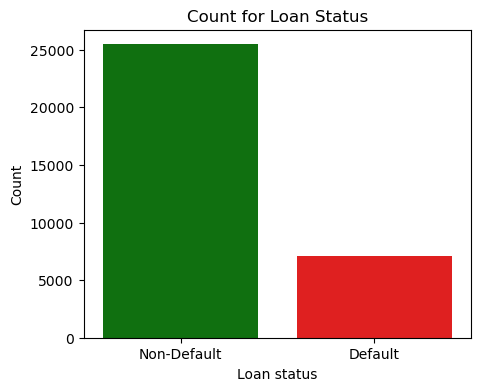

In [60]:
# plots count
ax = sns.countplot(x=df_2['loan_status'],palette=["g","r"])
ax.figure.set_size_inches(5, 4)
ax.set_title("Count for Loan Status", fontsize=12)
ax.set_ylabel("Count", fontsize=10)
ax.set_xlabel("Loan status", fontsize=10)
plt.xticks([0, 1], ['Non-Default', 'Default'])
plt.show()
# we can see that we are dealing with the less cases of default. thus we are dealing with imbalanced dataset.

#### Numerical Variables - 

In [17]:
# creating a dataset for numerical attributes/features
num = df_2.select_dtypes(include=['int64', 'float64'])
num.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
1,21,9600,5.0,1000,11.14,0,0.10,2
2,25,9600,1.0,5500,12.87,1,0.57,3
3,23,65500,4.0,35000,15.23,1,0.53,2
4,24,54400,8.0,35000,14.27,1,0.55,4
5,21,9900,2.0,2500,7.14,1,0.25,2


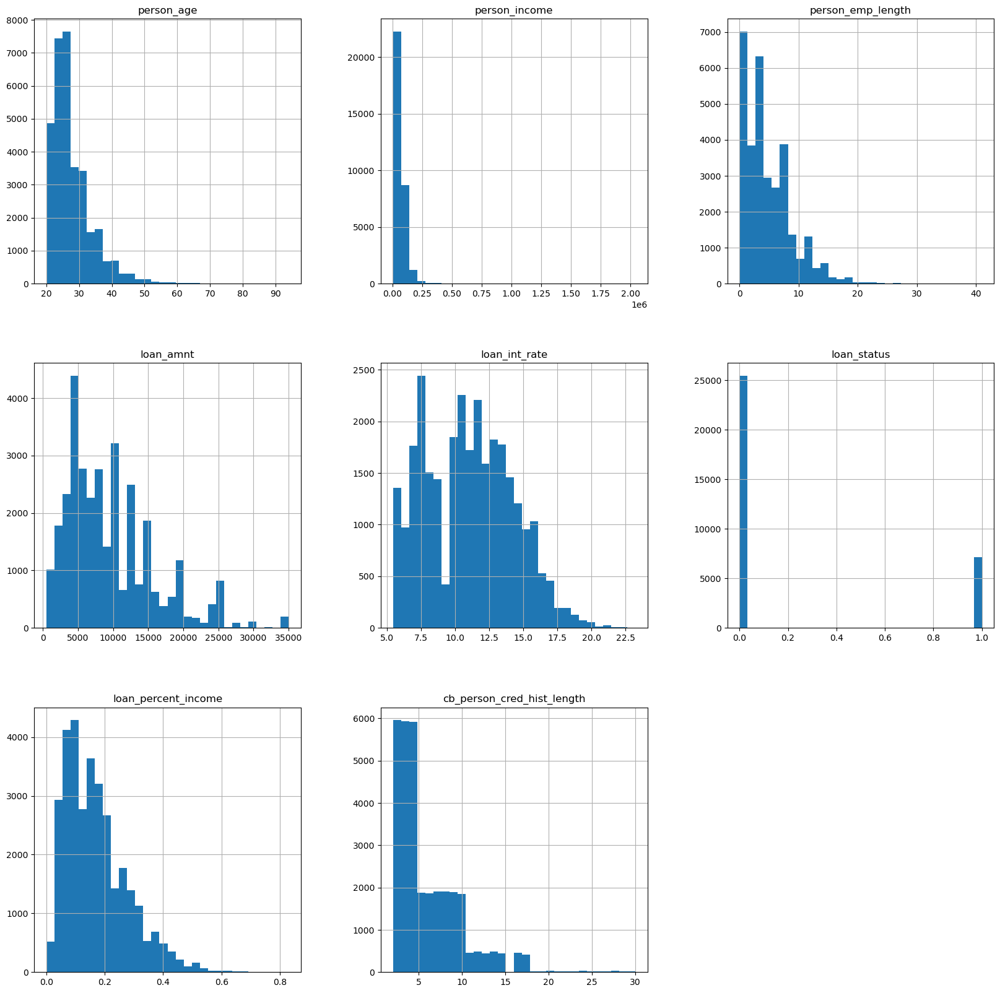

In [18]:
 _ = num.hist(bins=30,figsize=(20,20))
    # here wecan clearly see that no one feature has an normal distribution.

#### Categorical Variables -

In [21]:
# Creating a dataset for Categorical Features -
catego = df_2.select_dtypes(include="object")
catego.head()

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
1,OWN,EDUCATION,B,N
2,MORTGAGE,MEDICAL,C,N
3,RENT,MEDICAL,C,N
4,RENT,MEDICAL,C,Y
5,OWN,VENTURE,A,N


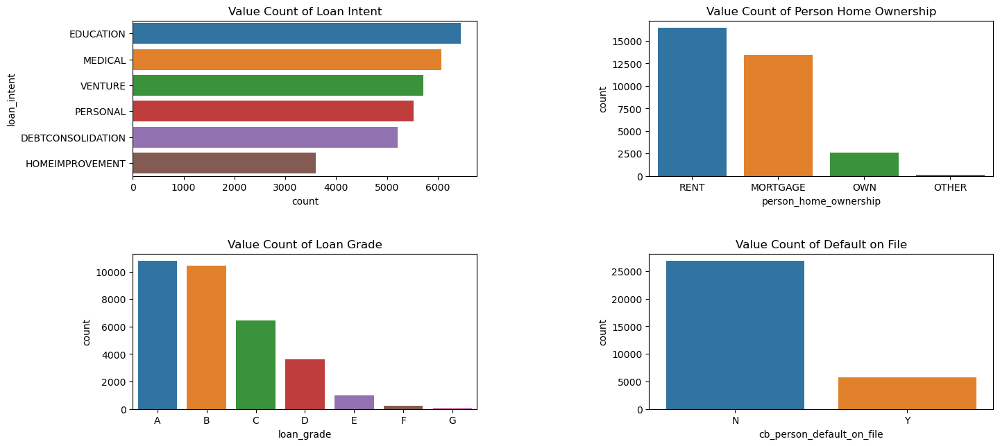

In [76]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(16,16)

plt.subplot(4,2,1)
sns.countplot(y=catego["loan_intent"],order=catego["loan_intent"].value_counts().index)
plt.title("Value Count of Loan Intent")

plt.subplot(4,2,2)
sns.countplot(x=catego["person_home_ownership"],order=catego["person_home_ownership"].value_counts().index)
plt.title("Value Count of Person Home Ownership")

plt.subplot(4,2,3)
sns.countplot(x=catego["loan_grade"],order=catego["loan_grade"].value_counts().index)
plt.title("Value Count of Loan Grade")

plt.subplot(4,2,4)
sns.countplot(x=catego["cb_person_default_on_file"],order=catego["cb_person_default_on_file"].value_counts().index)
plt.title("Value Count of Default on File")

plt.subplots_adjust(hspace = 0.5)
plt.subplots_adjust(wspace = 0.5)
plt.show()

### Bivariate analysis - Hypothesis Validation

#### 1) More defaults for the younger peoples - 

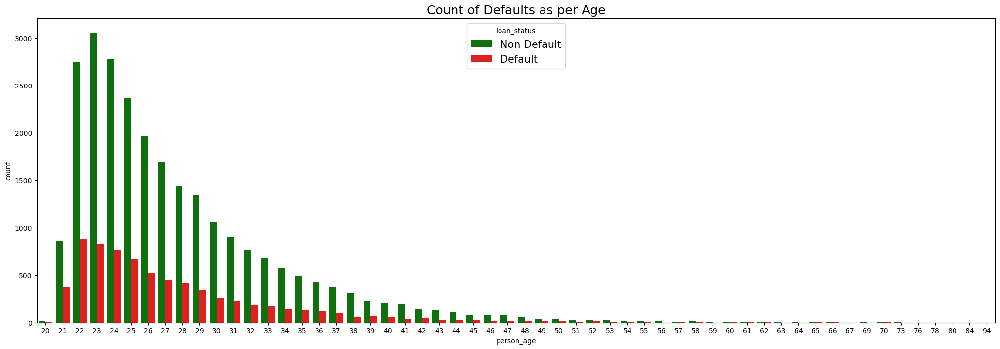

In [49]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(25,8)

sns.countplot(x=df_2["person_age"],hue=df_2["loan_status"],palette=["g","r"])
ax.set_title("Count of Defaults as per Age", fontsize=18)
plt.legend(title="loan_status",labels=["Non Default","Default"],fontsize=15)
plt.show()

In [74]:
# As we can see there are more cases of Default up to the young age of 20 to 40. 
# Thus Hypothesis is True

#### 2) People who defults have less income than people who have not defaults - 

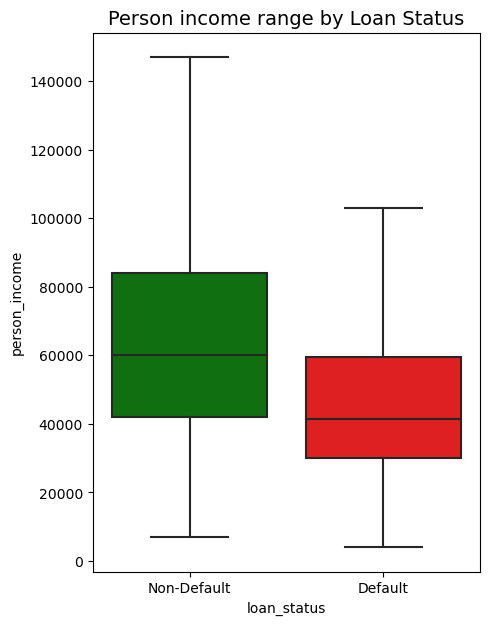

In [22]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(5,7)

sns.boxplot(y = df_2["person_income"], x= df_2["loan_status"],showfliers=False,palette=["g","r"])
ax.set_title("Person income range by Loan Status", fontsize=14)
plt.xticks([0,1],["Non-Default","Default"])
plt.show()

In [39]:
default = df_2[df_2["loan_status"] == 1]
nondefault = df_2[df_2["loan_status"] == 0]
print("Median of Loan Ammount for Defauts - ",default["person_income"].median())
print("Median of Loan Ammount for Non-Defauts - ",nondefault["person_income"].median())

Median of Loan Ammount for Defauts -  41496.0
Median of Loan Ammount for Non-Defauts -  60000.0


In [ ]:
# as we can see peoples who have defaults their incomes mean is less than peoples who have not default.
# thus Hypothesis is True

#### 3) Mortgage have more cases of default followed by rent and own - 

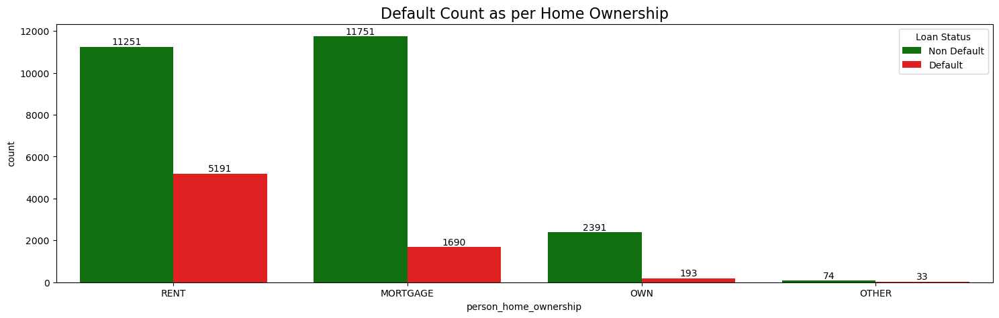

In [55]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(18,5)

sns.countplot(x = df_2["person_home_ownership"],hue = df_2["loan_status"],
            order =df_2["person_home_ownership"].value_counts().index, palette=["g","r"])
ax.set_title("Default Count as per Home Ownership", fontsize= 16)
plt.legend(title="Loan Status", labels=["Non Default","Default"],title_fontsize=10)

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

In [54]:
# As we can see Default cases for rent are more and then its followed by mortgage, own and other.
# Thus our Hypothesis is False

#### 4) There are fewer cases of default with long employment term -

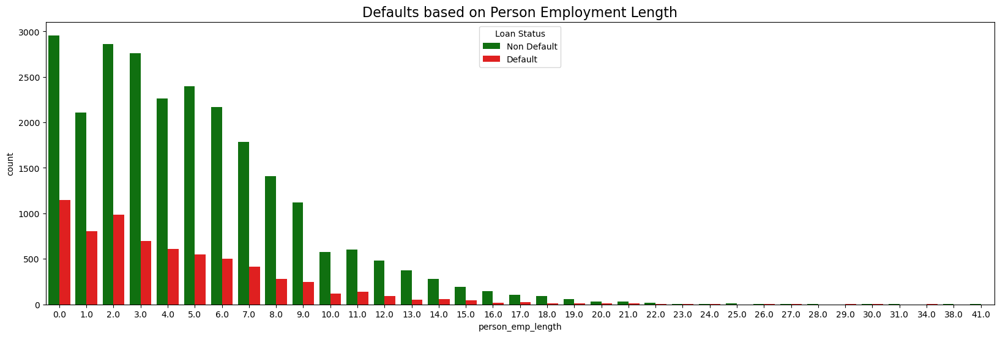

In [69]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,6)

sns.countplot(x = df_2["person_emp_length"],hue=df_2["loan_status"],palette=["g","r"])
ax.set_title("Defaults based on Person Employment Length", fontsize=16)
ax.legend(title="Loan Status", labels=["Non Default","Default"], fontsize=10)
plt.show()

In [ ]:
# we can see from the above chart there are fewer peoples of default after long employment length after 15 years.
# Thus our Hypothesis is True

#### 5) There are more cases of default for personal intent which is followed by educational ,home improvment, medical etc. -

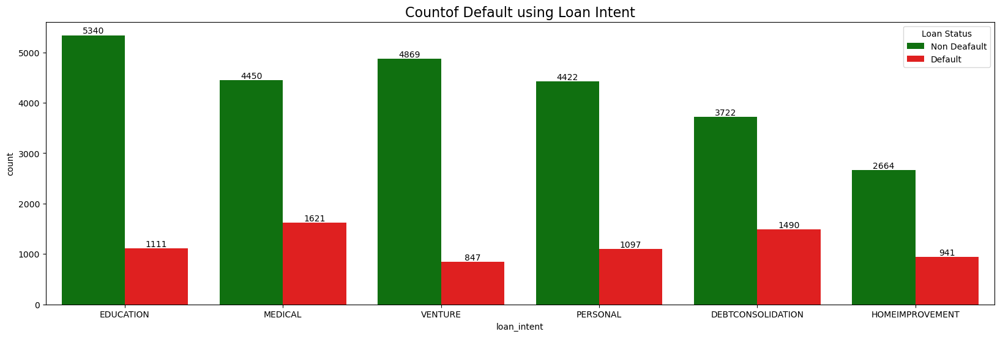

In [77]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,6)

sns.countplot(x = df_2["loan_intent"], hue=df_2["loan_status"],palette=["g","r"],
             order=df_2["loan_intent"].value_counts().index)
ax.set_title("Countof Default using Loan Intent", fontsize = 16)
ax.legend(title="Loan Status", labels = ["Non Deafault","Default"], fontsize=10)
for container in ax.containers:
    ax.bar_label(container)

In [ ]:
# From above Graph There are more cases of Default for Medical Which is Followed by debt consolidation,
# Education and personal case. 
# Thus Hypothesis is False.

#### 6) least cases of default for venture -

In [ ]:
# from above countplot we clearly see that Venture intent has least defaults.
# Thus Hypothesis is True.

#### 7) The higher the grade there are fewer cases of default -

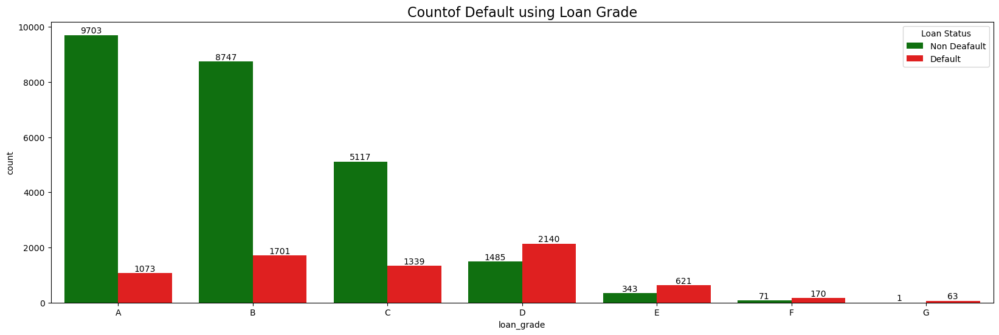

In [99]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,6)

sns.countplot(x = df_2["loan_grade"], hue=df_2["loan_status"],palette=["g","r"],
             order=df_2["loan_grade"].value_counts().index)
ax.set_title("Countof Default using Loan Grade", fontsize = 16)
ax.legend(title="Loan Status", labels = ["Non Deafault","Default"], fontsize=10)
for container in ax.containers:
    ax.bar_label(container)
plt.show()

In [ ]:
# From above graph we see that there id loan grade d has highest default but now we cannot say there are higher 
# grade then cases of defaults are less.
# Thus our Hypothesis is False.

#### 8) Median of ammount for non default is lower than median for default -

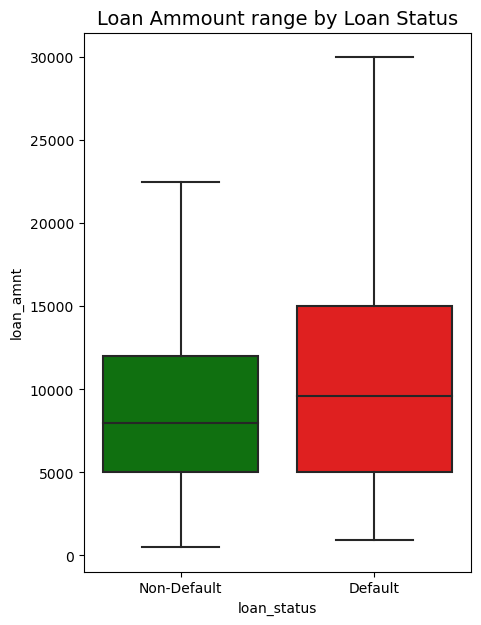

In [84]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(5,7)

sns.boxplot(y = df_2["loan_amnt"], x= df_2["loan_status"],showfliers=False,palette=["g","r"])
ax.set_title("Loan Ammount range by Loan Status", fontsize=14)
plt.xticks([0,1],["Non-Default","Default"])
plt.show()

In [40]:
print("Median of Loan Ammount for Defauts - ",default["loan_amnt"].median())
print("Median of Loan Ammount for Non-Defauts - ",nondefault["loan_amnt"].median())

Median of Loan Ammount for Defauts -  9600.0
Median of Loan Ammount for Non-Defauts -  8000.0


In [ ]:
# as we can see clearly median Values of Loan ammount according to loan status,Median loan ammount of defaults is Higher. 
# Thus our Hypothesis is True.

#### 9) Higher the intrest rate there are high defaults -

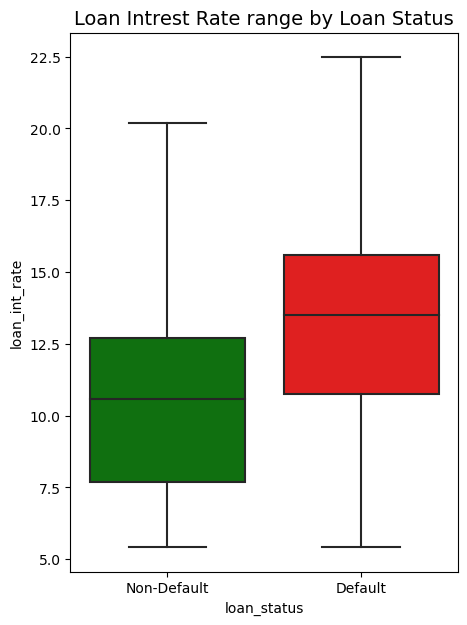

In [56]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(5,7)

sns.boxplot(y = df_2["loan_int_rate"], x= df_2["loan_status"],showfliers=False,palette=["g","r"])
ax.set_title("Loan Intrest Rate range by Loan Status", fontsize=14)
plt.xticks([0,1],["Non-Default","Default"])
plt.show()

In [94]:
print("Median of Loan Intrest Rate for Defauts - ",default["loan_int_rate"].median())
print("Median of Loan Intrest Rate for Non-Defauts - ",nondefault["loan_int_rate"].median())

Median of Loan Intrest Rate for Defauts -  13.49
Median of Loan Intrest Rate for Non-Defauts -  10.59


In [ ]:
# From above values of intrest rate median its clear that Higher the intrst rate there are more defaults.
# Thus our Hypothesis is True.

#### 10) People who allocate higher percentage of income to the loan tend to default more than people who allocate less - 

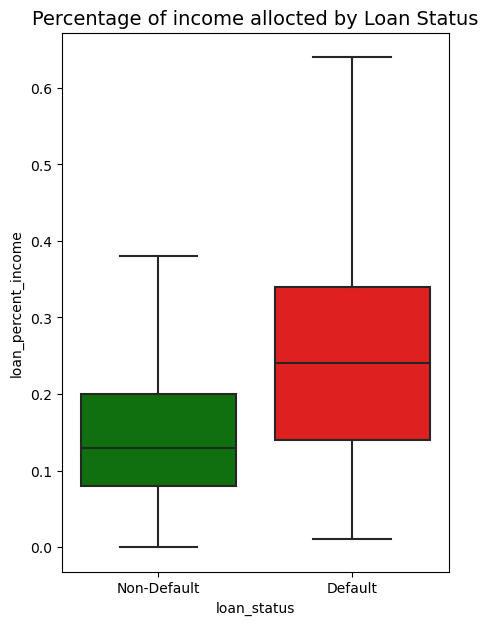

In [95]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(5,7)

sns.boxplot(y = df_2["loan_percent_income"], x= df_2["loan_status"],showfliers=False,palette=["g","r"])
ax.set_title("Percentage of income allocted by Loan Status", fontsize=14)
plt.xticks([0,1],["Non-Default","Default"])
plt.show()

In [96]:
print("Median of Loan Percent Income for Defauts - ",default["loan_percent_income"].median())
print("Median of Loan Percent Income for Non-Defauts - ",nondefault["loan_percent_income"].median())

Median of Loan Percent Income for Defauts -  0.24
Median of Loan Percent Income for Non-Defauts -  0.13


In [97]:
# From above values of median of loan percent income and charts we say that people who allocate higher percent of income 
# to loan they will tend to default more than people who allocate less.
# Thus our Hypothesis is True.

#### 11) There are more cases of default those have default on file -

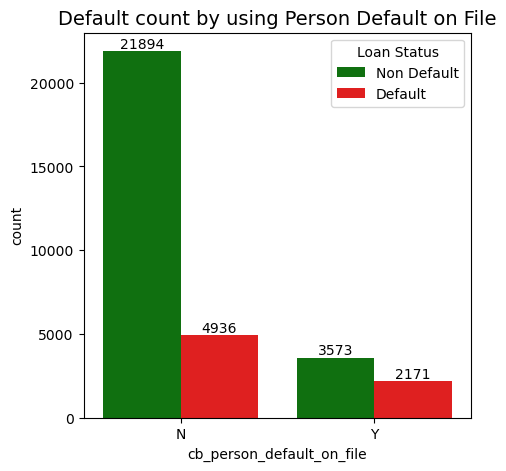

In [100]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(5,5)

sns.countplot(x = df_2["cb_person_default_on_file"], hue=df_2["loan_status"],palette=["g","r"])
ax.set_title("Default count by using Person Default on File", fontsize=14)
ax.legend(title="Loan Status", labels=["Non Default","Default"], fontsize=10)
for container in ax.containers:
    ax.bar_label(container)

plt.show()

In [ ]:
# From graph we can conclude that persons who dont have default on file those have more defaults.
# Thus our Hypothesis is False. 

#### 12) There are fewer cases of default those have higher credit history length - 

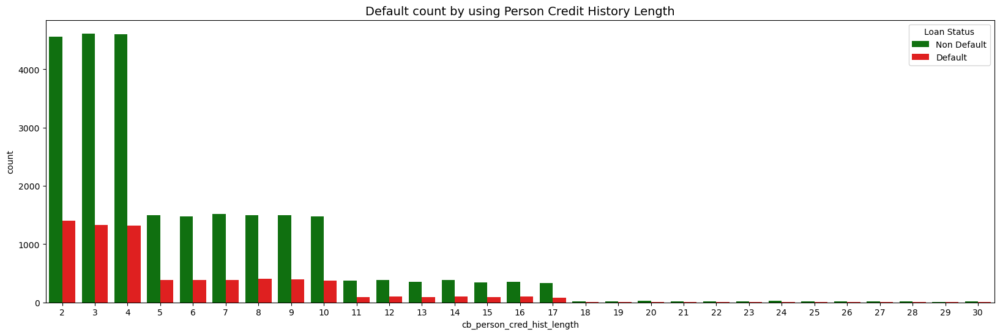

In [103]:
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,6)

sns.countplot(x = df_2["cb_person_cred_hist_length"], hue=df_2["loan_status"],palette=["g","r"])
ax.set_title("Default count by using Person Credit History Length", fontsize=14)
ax.legend(title="Loan Status", labels=["Non Default","Default"], fontsize=10)

plt.show()

In [ ]:
# As Observed, there are there are fewer cases of default for people having longer credit history length.
# Thus Hypothesis is True.

### Making Table of Results on Hypothesis Testing -

In [20]:
pd.options.display.max_colwidth = 130
result = pd.DataFrame({"ID":np.arange(1,13),
                    "Hypothesis":["More defaults for the younger peoples.",
                                  "People who defult have less income than people who have not default.",
                                  "Mortgage have more cases of default followed by rent and own.",
                                  "There are fewer people of default after long employment term.",
                                  "There are more cases of default for personal intent which is followed by educational ,home improvment, medical etc.",
                                  "Least cases of default for venture.",
                                  "The higher the grade there are fewer cases of default.",
                                  "Median of ammount for non default is lower than median for default.",
                                  "Higher the intrest rate there high defaults.",
                                  "People who allocate higher percentage of income to the loan tend to default more than people who allocate less.",
                                  "There are more cases of default those have default on file.",
                                  "There are fewer cases of default those have higher credit history length."],
                   "Conclusion":["True","True","False","True","False","True","False","True","True","True","False","True"]})
result.set_index("ID",inplace=True)
result

,Hypothesis,Conclusion
ID,,
1,More defaults for the younger peoples.,True
2,People who defult have less income than people who have not default.,True
3,Mortgage have more cases of default followed by rent and own.,False
4,There are fewer people of default after long employment term.,True
5,"There are more cases of default for personal intent which is followed by educational ,home improvment, medical etc.",False
6,Least cases of default for venture.,True
7,The higher the grade there are fewer cases of default.,False
8,Median of ammount for non default is lower than median for default.,True
9,Higher the intrest rate there high defaults.,True


In [77]:
# Saving Data After EDA and Hypothesis testing in one File -
df_2.to_csv("Credit.csv",index=False)

### 4) Feature Engineering - 

In [ ]:
1) Handling of Missing Values
2) Encoding - Ordinal,replace,OneHot,get_dummies()

- Handling of Missing Values

In [4]:
# Reading CSV file
df_2 = pd.read_csv("Credit.csv")
df_2.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
1,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
2,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
3,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
4,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


In [5]:
# Handling Missing Values in Feature person_emp_length by using Median after discussion with buisness experties.
df_2["person_emp_length"] = df_2["person_emp_length"].replace(np.nan,df_2["person_emp_length"].median())
df_2["loan_int_rate"] = df_2["loan_int_rate"].replace(np.nan,df_2["loan_int_rate"].median())

In [6]:
df_2["person_emp_length"].median(),df_2["person_emp_length"].mean(),mode(df_2["person_emp_length"])[0][0]

(4.0, 4.760575919444956, 0.0)

In [7]:
df_2["loan_int_rate"].median(),df_2["loan_int_rate"].mean(),mode(df_2["loan_int_rate"])[0][0]

(10.99, 11.009469822556719, 10.99)

 - Encoding - Ordinal,replace,OneHot,get_dummies()

In [8]:
# Features for OneHotEncoding / Get Dummies - person_home_ownership, loan_intent, loan_grade

In [9]:
# Applying OneHotEncoding on person_home_ownership Feature
one = OneHotEncoder()
array = one.fit_transform(df_2[["person_home_ownership"]]).toarray()
df2 = pd.DataFrame(array,columns=df_2["person_home_ownership"].unique())
df2.head()

,OWN,MORTGAGE,RENT,OTHER
0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,1.0
4,0.0,0.0,1.0,0.0


In [10]:
# Creating new df after one hot encoding
df1 = pd.concat([df_2,df2],axis=1)
df1.drop("person_home_ownership",axis=1,inplace=True)
df1.head()

,person_age,person_income,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,OWN,MORTGAGE,RENT,OTHER
0,21,9600,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2,0.0,0.0,1.0,0.0
1,25,9600,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3,1.0,0.0,0.0,0.0
2,23,65500,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2,0.0,0.0,0.0,1.0
3,24,54400,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4,0.0,0.0,0.0,1.0
4,21,9900,2.0,VENTURE,A,2500,7.14,1,0.25,N,2,0.0,0.0,1.0,0.0


In [11]:
# Applying get_dummies function on loan_intent and loan_grade for Encoding
df = pd.get_dummies(df1,columns=["loan_intent","loan_grade"])
df.shape

(32574, 26)

In [12]:
# Checking for dataframe after get dummies operation.
df.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,OWN,MORTGAGE,RENT,OTHER,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G
0,21,9600,5.0,1000,11.14,0,0.10,N,2,0.0,0.0,1.0,0.0,0,1,0,0,0,0,0,1,0,0,0,0,0
1,25,9600,1.0,5500,12.87,1,0.57,N,3,1.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0
2,23,65500,4.0,35000,15.23,1,0.53,N,2,0.0,0.0,0.0,1.0,0,0,0,1,0,0,0,0,1,0,0,0,0
3,24,54400,8.0,35000,14.27,1,0.55,Y,4,0.0,0.0,0.0,1.0,0,0,0,1,0,0,0,0,1,0,0,0,0
4,21,9900,2.0,2500,7.14,1,0.25,N,2,0.0,0.0,1.0,0.0,0,0,0,0,0,1,1,0,0,0,0,0,0


In [13]:
# Features for OrdinalEncoding / replace - cb_person_default_on_file

In [14]:
df["cb_person_default_on_file"].value_counts().to_dict()

{'N': 26830, 'Y': 5744}

In [15]:
# Applying OrdinalEncoding on cb_person_default_on_file Feature
ordE = OrdinalEncoder(categories=[['N', 'Y']])
df["cb_person_default_on_file"] = ordE.fit_transform(df[["cb_person_default_on_file"]])
print(f"Unique values - ",df["cb_person_default_on_file"].unique())
df.head()

Unique values -  [0. 1.]


,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,OWN,MORTGAGE,RENT,OTHER,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G
0,21,9600,5.0,1000,11.14,0,0.10,0.0,2,0.0,0.0,1.0,0.0,0,1,0,0,0,0,0,1,0,0,0,0,0
1,25,9600,1.0,5500,12.87,1,0.57,0.0,3,1.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0
2,23,65500,4.0,35000,15.23,1,0.53,0.0,2,0.0,0.0,0.0,1.0,0,0,0,1,0,0,0,0,1,0,0,0,0
3,24,54400,8.0,35000,14.27,1,0.55,1.0,4,0.0,0.0,0.0,1.0,0,0,0,1,0,0,0,0,1,0,0,0,0
4,21,9900,2.0,2500,7.14,1,0.25,0.0,2,0.0,0.0,1.0,0.0,0,0,0,0,0,1,1,0,0,0,0,0,0


In [16]:
# Checking for correct Encoding Happened or Not. All Datatypes are numerical so we can now implement model.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32574 entries, 0 to 32573
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   person_age                     32574 non-null  int64  
 1   person_income                  32574 non-null  int64  
 2   person_emp_length              32574 non-null  float64
 3   loan_amnt                      32574 non-null  int64  
 4   loan_int_rate                  32574 non-null  float64
 5   loan_status                    32574 non-null  int64  
 6   loan_percent_income            32574 non-null  float64
 7   cb_person_default_on_file      32574 non-null  float64
 8   cb_person_cred_hist_length     32574 non-null  int64  
 9   OWN                            32574 non-null  float64
 10  MORTGAGE                       32574 non-null  float64
 11  RENT                           32574 non-null  float64
 12  OTHER                          32574 non-null 

In [17]:
# Checking for Statistics of dataset after Encoding.
df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,OWN,MORTGAGE,RENT,OTHER,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G
count,32574.000000,3.257400e+04,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000
mean,27.718426,6.587848e+04,4.760576,9588.018051,11.009470,0.218180,0.170202,0.176337,5.804108,0.412630,0.003285,0.079327,0.504758,0.160005,0.198041,0.110671,0.186376,0.169430,0.175477,0.330816,0.320747,0.198195,0.111285,0.029594,0.007399,0.001965
std,6.204987,5.253194e+04,3.981181,6320.249598,3.081664,0.413017,0.106755,0.381112,4.053873,0.492315,0.057220,0.270253,0.499985,0.366616,0.398530,0.313729,0.389415,0.375137,0.380381,0.470514,0.466771,0.398646,0.314490,0.169467,0.085697,0.044283
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,8.490000,0.000000,0.090000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,0.000000,4.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.110000,0.000000,0.230000,0.000000,8.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,94.000000,2.039784e+06,41.000000,35000.000000,23.220000,1.000000,0.830000,1.000000,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 5) Feature Selection - 

In [18]:
# Checking for Correlation of Each independent feature with target feature.
df.corr()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,OWN,MORTGAGE,RENT,OTHER,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G
person_age,1.000000,0.140497,0.170688,0.051751,0.011288,-0.020687,-0.041587,0.007223,0.878094,0.033171,-0.008463,-0.000941,-0.031185,-0.007887,-0.093180,0.076646,0.021567,0.034226,-0.013820,-0.006086,-0.006838,0.003697,0.009167,0.004217,0.008825,0.005142
person_income,0.140497,1.000000,0.155439,0.317497,-0.001051,-0.168485,-0.294558,-0.002524,0.123049,0.235999,0.011485,-0.044946,-0.209399,0.004922,-0.016714,0.051513,-0.040464,0.007845,0.003969,0.009076,0.006032,-0.018025,-0.014911,0.016604,0.018293,0.009202
person_emp_length,0.170688,0.155439,1.000000,0.111820,-0.052830,-0.085613,-0.058515,-0.029010,0.147713,0.224239,-0.015550,0.024216,-0.232109,-0.001938,-0.038437,0.030457,-0.001851,0.009114,0.009924,0.051037,-0.004287,-0.040105,-0.009099,-0.017027,-0.011095,0.015206
loan_amnt,0.051751,0.317497,0.111820,1.000000,0.139473,0.105240,0.572420,0.038875,0.042240,0.130825,0.013502,-0.025919,-0.116354,0.000474,-0.008373,0.043118,-0.024872,-0.001288,-0.000514,-0.116789,0.044132,-0.029328,0.070243,0.091952,0.070067,0.053408
loan_int_rate,0.011288,-0.001051,-0.052830,0.139473,1.000000,0.319320,0.114420,0.477124,0.015724,-0.128396,0.016668,-0.013045,0.131570,-0.003618,-0.008958,0.019831,0.006765,-0.001939,-0.008497,-0.762256,-0.003230,0.357005,0.456516,0.310645,0.188999,0.122650
loan_status,-0.020687,-0.168485,-0.085613,0.105240,0.319320,1.000000,0.379250,0.179002,-0.015472,-0.187607,0.012542,-0.101981,0.238416,0.071540,-0.055298,0.036596,0.056582,-0.021229,-0.078189,-0.201916,-0.092132,-0.012972,0.318868,0.180130,0.101846,0.082311
loan_percent_income,-0.041587,-0.294558,-0.058515,0.572420,0.114420,0.379250,1.000000,0.035617,-0.031447,-0.147991,0.011702,0.051076,0.116774,0.002541,-0.000037,-0.015489,0.012743,-0.004303,0.001563,-0.108765,0.032735,-0.000319,0.068663,0.058554,0.036750,0.030633
cb_person_default_on_file,0.007223,-0.002524,-0.029010,0.038875,0.477124,0.179002,0.035617,1.000000,0.004634,-0.061546,0.014264,-0.003474,0.060847,0.003501,-0.007186,0.015484,-0.001767,-0.003479,-0.003376,-0.325325,-0.317952,0.427897,0.316536,0.140230,0.065332,0.044958
cb_person_cred_hist_length,0.878094,0.123049,0.147713,0.042240,0.015724,-0.015472,-0.031447,0.004634,1.000000,0.024274,-0.006755,0.004657,-0.025645,-0.009130,-0.078752,0.058976,0.016244,0.035189,-0.008666,-0.010415,-0.003591,0.007213,0.008286,0.001110,0.006911,0.007104
OWN,0.033171,0.235999,0.224239,0.130825,-0.128396,-0.187607,-0.147991,-0.061546,0.024274,1.000000,-0.048117,-0.246027,-0.846170,0.027449,-0.005613,0.050381,-0.050455,0.010256,-0.020589,0.133926,-0.034622,-0.064125,-0.056469,-0.021627,-0.001778,0.006466


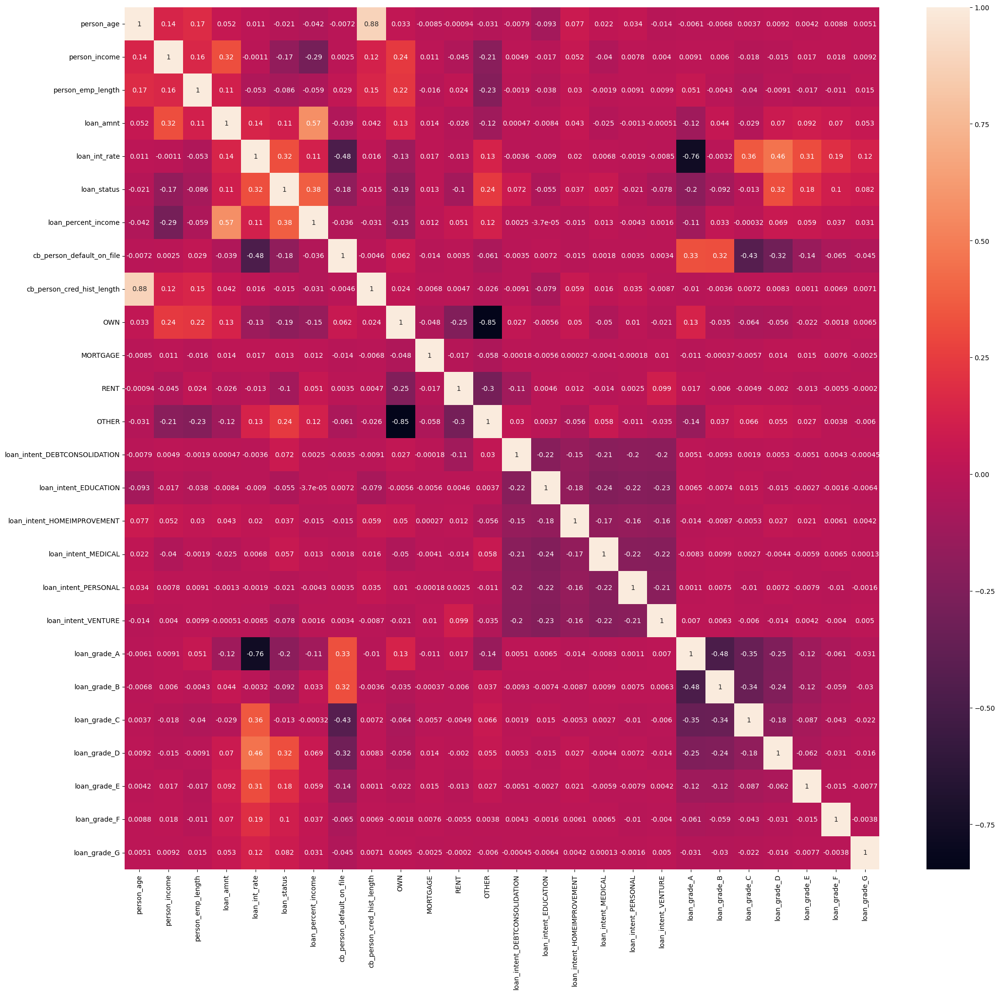

In [23]:
# Heatmap of Correlation
plt.figure(figsize=(25,23))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [101]:
df.corr().loc["loan_status"].sort_values(ascending=False)

loan_status                      1.000000
loan_percent_income              0.379250
loan_int_rate                    0.319320
loan_grade_D                     0.318868
OTHER                            0.238416
loan_grade_E                     0.180130
loan_amnt                        0.105240
loan_grade_F                     0.101846
loan_grade_G                     0.082311
loan_intent_DEBTCONSOLIDATION    0.071540
loan_intent_MEDICAL              0.056582
loan_intent_HOMEIMPROVEMENT      0.036596
MORTGAGE                         0.012542
loan_grade_C                    -0.012972
cb_person_cred_hist_length      -0.015472
person_age                      -0.020687
loan_intent_PERSONAL            -0.021229
loan_intent_EDUCATION           -0.055298
loan_intent_VENTURE             -0.078189
person_emp_length               -0.085613
loan_grade_B                    -0.092132
RENT                            -0.101981
person_income                   -0.168485
cb_person_default_on_file       -0

<AxesSubplot:>

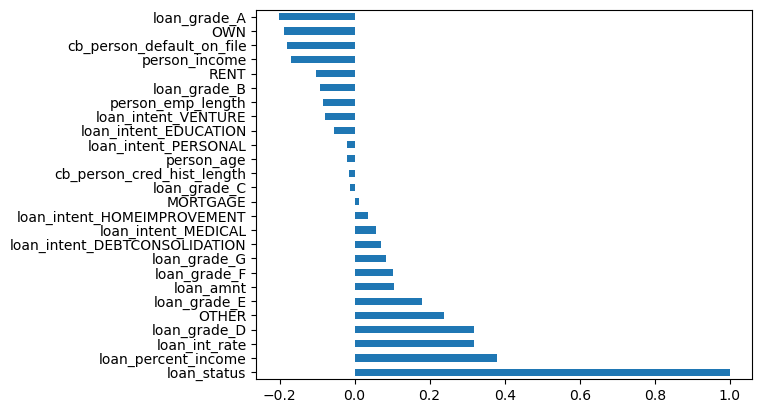

In [103]:
# plot of Correlation of Target feature with independent Feature
d1 = df.corr().loc["loan_status"].sort_values(ascending=False)
d1.plot(kind="barh")

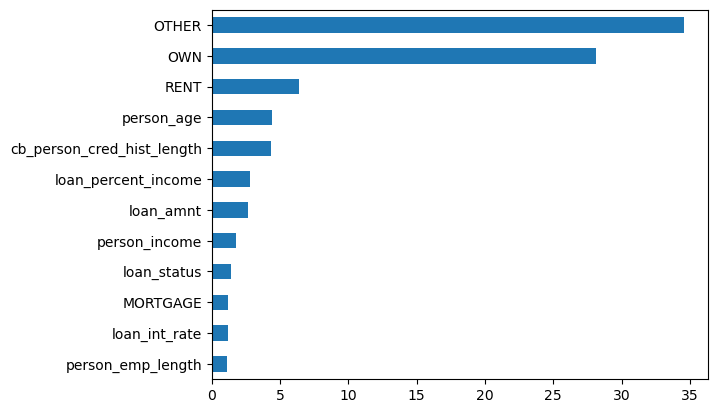

In [104]:
# Checking for relation between independent features after encoding.
x = df1.select_dtypes(exclude="object")
vif_list = []
for i in range(x.shape[1]):
    vif = variance_inflation_factor(x.to_numpy(),i)
    vif_list.append(vif)
x1 = pd.Series(vif_list,index=x.columns)
x1.sort_values().plot(kind="barh")
plt.show()

### 6) Model Selection - 

#### 6.1) Splitting of dataset - 

In [19]:
# Splitting of dataset for the training and testing
x = df.drop("loan_status",axis=1)
y = df["loan_status"]
x_train,x_test,y_train,y_test = train_test_split(x,y,train_size=0.8,random_state=42,stratify=y)

In [20]:
# Checking for the proper splitting happened or not.
print(f"X Train Shape - {x_train.shape}")
print(f"X Test Shape - {x_test.shape}")
print(f"Y Train Shape - {y_train.shape}")
print(f"Y Test Shape - {y_test.shape}")

X Train Shape - (26059, 25)
X Test Shape - (6515, 25)
Y Train Shape - (26059,)
Y Test Shape - (6515,)


In [21]:
# Normalizing the data to resuce effect of outliers, Here we are using Standard scalar
ss = StandardScaler()
x_train = ss.fit_transform(x_train)
x_test = ss.transform(x_test)

#### 6.2) Model fitting - 

In [22]:
# Model Training for logistic regression -
lr_model = LogisticRegression()
lr_model.fit(x_train,y_train)

LogisticRegression()

In [23]:
# Model Training for KNN regression -
knn_model = KNeighborsClassifier()
knn_model.fit(x_train,y_train)

KNeighborsClassifier()

In [24]:
# Model Training for Descision Tree regression -
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

### 7) Model Evaluation -

In [25]:
# Evaluation of Logistic regression Model based on Training data -
y_pred = lr_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

preci = precision_score(y_train,y_pred)
print(f"Precision - {preci}\n")
recal = recall_score(y_train,y_pred)
print(f"Recall - {recal}\n")
accuracy = accuracy_score(y_train,y_pred)
print(f"Accuracy - {accuracy}\n")
f1 = f1_score(y_train,y_pred)
print(f"F1 Score - {f1}\n")

cnf_report = classification_report(y_train,y_pred)
print(f"Classification report - \n{cnf_report}")

Confusion matrix - 
[[19414   959]
 [ 2495  3191]]

Precision - 0.7689156626506024

Recall - 0.5612029546253957

Accuracy - 0.8674546222034614

F1 Score - 0.6488409922732818

Classification report - 
              precision    recall  f1-score   support

           0       0.89      0.95      0.92     20373
           1       0.77      0.56      0.65      5686

    accuracy                           0.87     26059
   macro avg       0.83      0.76      0.78     26059
weighted avg       0.86      0.87      0.86     26059



In [26]:
# Evaluation of Logistic regression Model based on Testing data -
y_pred = lr_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

preci = precision_score(y_test,y_pred)
print(f"Precision - {preci}\n")
recal = recall_score(y_test,y_pred)
print(f"Recall - {recal}\n")
accuracy = accuracy_score(y_test,y_pred)
print(f"Accuracy - {accuracy}\n")
f1 = f1_score(y_test,y_pred)
print(f"F1 Score - {f1}\n")

cnf_report = classification_report(y_test,y_pred)
print(f"Classification report - \n{cnf_report}")
res = pd.DataFrame([["Logistic Regression",preci,recal,accuracy,f1]],
                   columns=["Model","Precision","Recall","Accuracy","f1 Score"])

Confusion matrix - 
[[4863  231]
 [ 656  765]]

Precision - 0.7680722891566265

Recall - 0.5383532723434201

Accuracy - 0.8638526477359939

F1 Score - 0.6330161357054199

Classification report - 
              precision    recall  f1-score   support

           0       0.88      0.95      0.92      5094
           1       0.77      0.54      0.63      1421

    accuracy                           0.86      6515
   macro avg       0.82      0.75      0.77      6515
weighted avg       0.86      0.86      0.85      6515



In [27]:
# Evaluation of KNN classifier Model based on Training data -
y_pred = knn_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

preci = precision_score(y_train,y_pred)
print(f"Precision - {preci}\n")
recal = recall_score(y_train,y_pred)
print(f"Recall - {recal}\n")
accuracy = accuracy_score(y_train,y_pred)
print(f"Accuracy - {accuracy}\n")
f1 = f1_score(y_train,y_pred)
print(f"F1 Score - {f1}\n")

cnf_report = classification_report(y_train,y_pred)
print(f"Classification report - \n{cnf_report}")

Confusion matrix - 
[[20062   311]
 [ 1791  3895]]

Precision - 0.9260580123632906

Recall - 0.6850158283503341

Accuracy - 0.9193368893664376

F1 Score - 0.7875050545895673

Classification report - 
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     20373
           1       0.93      0.69      0.79      5686

    accuracy                           0.92     26059
   macro avg       0.92      0.83      0.87     26059
weighted avg       0.92      0.92      0.91     26059



In [28]:
# Evaluation of KNN classifer Model based on Testing data -
y_pred = knn_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

preci1 = precision_score(y_test,y_pred)
print(f"Precision - {preci1}\n")
recal1 = recall_score(y_test,y_pred)
print(f"Recall - {recal1}\n")
accuracy1 = accuracy_score(y_test,y_pred)
print(f"Accuracy - {accuracy1}\n")
f11 = f1_score(y_test,y_pred)
print(f"F1 Score - {f11}\n")

cnf_report = classification_report(y_test,y_pred)
print(f"Classification report - \n{cnf_report}")
res1 = pd.DataFrame([["KNN Classifier",preci1,recal1,accuracy1,f11]],
                   columns=["Model","Precision","Recall","Accuracy","f1 Score"])

Confusion matrix - 
[[4958  136]
 [ 539  882]]

Precision - 0.8664047151277013

Recall - 0.6206896551724138

Accuracy - 0.896392939370683

F1 Score - 0.7232472324723247

Classification report - 
              precision    recall  f1-score   support

           0       0.90      0.97      0.94      5094
           1       0.87      0.62      0.72      1421

    accuracy                           0.90      6515
   macro avg       0.88      0.80      0.83      6515
weighted avg       0.89      0.90      0.89      6515



In [29]:
# Evaluation of Descision Tree classifier Model based on Training data -
y_pred = dt_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

preci = precision_score(y_train,y_pred)
print(f"Precision - {preci}\n")
recal = recall_score(y_train,y_pred)
print(f"Recall - {recal}\n")
accuracy = accuracy_score(y_train,y_pred)
print(f"Accuracy - {accuracy}\n")
f1 = f1_score(y_train,y_pred)
print(f"F1 Score - {f1}\n")

cnf_report = classification_report(y_train,y_pred)
print(f"Classification report - \n{cnf_report}")

Confusion matrix - 
[[20373     0]
 [    0  5686]]

Precision - 1.0

Recall - 1.0

Accuracy - 1.0

F1 Score - 1.0

Classification report - 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     20373
           1       1.00      1.00      1.00      5686

    accuracy                           1.00     26059
   macro avg       1.00      1.00      1.00     26059
weighted avg       1.00      1.00      1.00     26059



In [30]:
# Evaluation of Descision Tree classifer Model based on Testing data -
y_pred = dt_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

preci2 = precision_score(y_test,y_pred)
print(f"Precision - {preci2}\n")
recal2 = recall_score(y_test,y_pred)
print(f"Recall - {recal2}\n")
accuracy2 = accuracy_score(y_test,y_pred)
print(f"Accuracy - {accuracy2}\n")
f12 = f1_score(y_test,y_pred)
print(f"F1 Score - {f12}\n")

cnf_report = classification_report(y_test,y_pred)
print(f"Classification report - \n{cnf_report}")
res2 = pd.DataFrame([["Descision Tree Classifier",preci2,recal2,accuracy2,f12]],
                   columns=["Model","Precision","Recall","Accuracy","f1 Score"])

Confusion matrix - 
[[4718  376]
 [ 331 1090]]

Precision - 0.7435197817189632

Recall - 0.7670654468684025

Accuracy - 0.891481197237145

F1 Score - 0.7551091098025631

Classification report - 
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      5094
           1       0.74      0.77      0.76      1421

    accuracy                           0.89      6515
   macro avg       0.84      0.85      0.84      6515
weighted avg       0.89      0.89      0.89      6515



In [31]:
# Creating new dataframe by joining 3 dataframes of evaluation values of different models
result = pd.concat([res,res1,res2],ignore_index=True)
result

,Model,Precision,Recall,Accuracy,f1 Score
0,Logistic Regression,0.768072,0.538353,0.863853,0.633016
1,KNN Classifier,0.866405,0.620690,0.896393,0.723247
2,Descision Tree Classifier,0.743520,0.767065,0.891481,0.755109


As observed, for the context of our project, we are aiming for recall. `Descision Tree` presents the highest
recall score. Lets assume we are aiming more for recall and  precision, we could then, take advantage of f1-score, 
as its the harmonic average between precision and recall. Thus, the algorithm that satisfies 
this need is `Descision Tree`.

#### Probability Distribution

In [20]:
# Storing predicted probabilities for class 1 
y_pred_lr_prob = lr_model.predict_proba(x_test)[:,1]
y_pred_knn_prob = knn_model.predict_proba(x_test)[:,1]
y_pred_dt_prob = dt_model.predict_proba(x_test)[:,1]

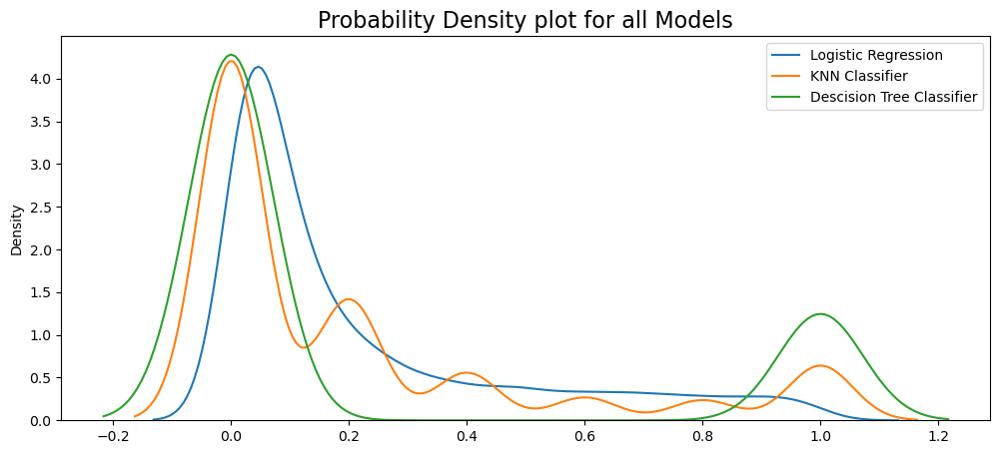

In [21]:
plt.figure(figsize=(12,5))
sns.kdeplot(y_pred_lr_prob,label="Logistic Regression")
sns.kdeplot(y_pred_knn_prob,label="KNN Classifier")
sns.kdeplot(y_pred_dt_prob,label="Descision Tree Classifier")
plt.title("Probability Density plot for all Models",fontsize=16)
plt.legend()
plt.show()

In [ ]:
As observed, in general all the algorithms presents most probabilities concentrated around `0`. However, 
`DescisionTreeClassifier` presents the largest amount of probabilities concentrated around `0` while 
`DescisionTreeClassifier` presenting the least with a moderate distributed probabilities around other values. 
The term `DescisionTreeClassifier` suits best for the context and challenge of our project.

### Cross Validatation

In [30]:
# Cross Validation of descision tree model
cv = StratifiedKFold(n_splits=10)

In [189]:
cv_scores = cross_val_score(dt_model, x, np.ravel(y), cv = cv, scoring='precision', n_jobs=-1)

# prints the average precision and standard deviation of the scores
print("Average precision: %0.4f (+/- %0.4f)" % (cv_scores.mean(), cv_scores.std() * 2))

# calculates the cross validation scores
cv_scores = cross_val_score(dt_model, x, np.ravel(y), cv = cv, scoring='recall', n_jobs=-1)

# prints the average recall and standard deviation of the scores
print("\nAverage recall: %0.4f (+/- %0.4f)" % (cv_scores.mean(), cv_scores.std() * 2))

# calculates the cross validation scores
cv_scores = cross_val_score(dt_model, x, np.ravel(y), cv = cv, scoring='f1', n_jobs=-1)

# prints the average f1-score and standard deviation of the scores
print("\nAverage f1-score: %0.4f (+/- %0.4f)" % (cv_scores.mean(), cv_scores.std() * 2))

# calculates the cross validation scores
cv_scores = cross_val_score(dt_model, x, np.ravel(y), cv = cv, scoring='roc_auc', n_jobs=-1)

# prints the average roc_auc and standard deviation of the scores
print("\nAverage ROC AUC: %0.4f (+/- %0.4f)" % (cv_scores.mean(), cv_scores.std() * 2))


cv_scores = cross_val_score(dt_model, x, np.ravel(y), cv = cv, scoring='accuracy', n_jobs=-1)
print("\nAverage accuracy: %0.4f (+/- %0.4f)" % (cv_scores.mean(), cv_scores.std() * 2))

Average precision: 0.6514 (+/- 0.1806)

Average recall: 0.7601 (+/- 0.1544)

Average f1-score: 0.7011 (+/- 0.1226)

Average ROC AUC: 0.8213 (+/- 0.0791)

Average accuracy: 0.8573 (+/- 0.0703)


### Pruning - for reducing Overfitting

In [32]:
# Model training of Dt for ccp alpha values
dt_clf_ccp = DecisionTreeClassifier(random_state=10,ccp_alpha=0.0)
dt_clf_ccp.fit(x_train,y_train)

DecisionTreeClassifier(random_state=10)

In [33]:
result1 = dt_clf_ccp.cost_complexity_pruning_path(x_train,y_train)
ccp_list = result1["ccp_alphas"]
ccp_list

array([0.00000000e+00, 1.89991189e-05, 1.90723354e-05, 1.90769575e-05,
       1.91179610e-05, 1.91562318e-05, 2.13191433e-05, 2.15658111e-05,
       2.23851005e-05, 2.41616958e-05, 2.43038234e-05, 2.43647352e-05,
       2.45170148e-05, 2.45170148e-05, 2.45990115e-05, 2.46354545e-05,
       2.46526821e-05, 2.47302062e-05, 2.47577148e-05, 2.48305316e-05,
       2.49269983e-05, 2.49269983e-05, 2.49433977e-05, 2.49738536e-05,
       2.49738536e-05, 2.50015408e-05, 2.50144615e-05, 2.50813451e-05,
       2.50909917e-05, 2.51002744e-05, 2.51341479e-05, 2.51341479e-05,
       2.52011366e-05, 2.52122043e-05, 2.52276529e-05, 2.52276529e-05,
       2.52372561e-05, 2.52889148e-05, 2.53018404e-05, 2.53048962e-05,
       2.53108127e-05, 2.53393246e-05, 2.53679890e-05, 2.53815312e-05,
       2.53975881e-05, 2.54015325e-05, 2.54135483e-05, 2.54146629e-05,
       2.54179205e-05, 2.54189786e-05, 2.54310380e-05, 2.54899430e-05,
       2.55829720e-05, 2.55829720e-05, 2.84167818e-05, 2.84422453e-05,
      

In [33]:
test_acc_list = []
train_acc_list = []
for ccp in ccp_list:
    dt_clf_ccp = DecisionTreeClassifier(random_state=10,ccp_alpha=ccp)
    dt_clf_ccp.fit(x_train,y_train)
    train_acc_list.append(dt_clf_ccp.score(x_train,y_train))
    test_acc_list.append(dt_clf_ccp.score(x_test,y_test))

In [34]:
index = np.argmax(test_acc_list)
index

713

In [35]:
# best value of ccp alpha
cc_val = ccp_list[index]
print("Best Value of CCP Alpha - ",cc_val)

Best Value of CCP Alpha -  0.00014924755385420764


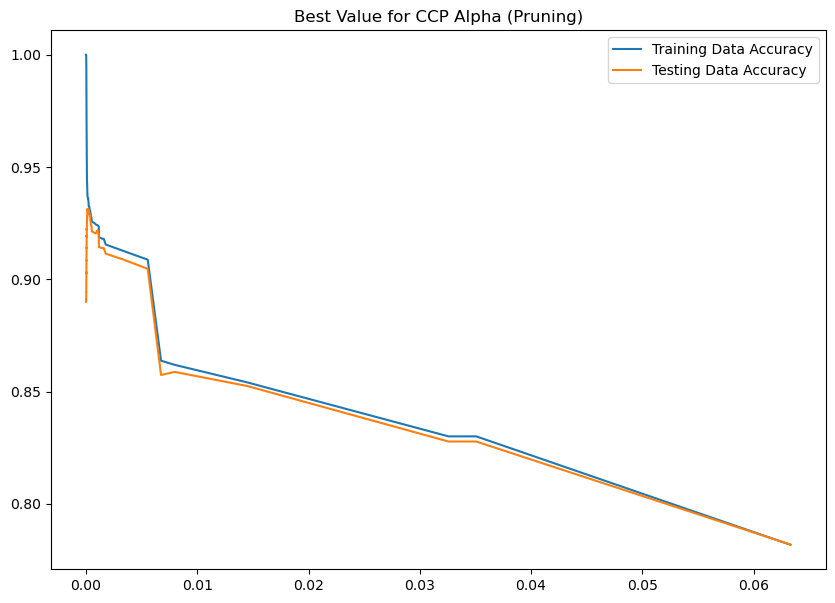

In [51]:
# Plot of Accuracies to take best value of ccp alpha from graph
fig,ax = plt.subplots()
ax.figure.set_size_inches(10,7)
ax.plot(ccp_list,train_acc_list,label="Training Data Accuracy")
ax.plot(ccp_list,test_acc_list,label="Testing Data Accuracy")
ax.legend()
plt.title("Best Value for CCP Alpha (Pruning)")
plt.show()

In [35]:
dt_clf_ccp = DecisionTreeClassifier(random_state=10,ccp_alpha=0.00014924755385420764)
dt_clf_ccp.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.00014924755385420764, random_state=10)

In [36]:
# Training Accuracy after pruning for the Descision Tree Model -
y_pred_train = dt_clf_ccp.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred_train)
print(f"Confusion matrix - \n{cnf_matrix}\n")

accuracy = accuracy_score(y_train,y_pred_train)
print(f"Accuracy - {accuracy}\n")

preci = precision_score(y_train,y_pred_train)
print(f"Precision - {preci}\n")

recal = recall_score(y_train,y_pred_train)
print(f"Recall - {recal}\n")

f1 = f1_score(y_train,y_pred_train)
print(f"F1 Score - {f1}\n")

clf_report = classification_report(y_train,y_pred_train)
print(f"Classification report - \n{clf_report}")

Confusion matrix - 
[[20244   129]
 [ 1516  4170]]

Accuracy - 0.9368740166545148

Precision - 0.9699930216329379

Recall - 0.7333802321491383

F1 Score - 0.8352528793189784

Classification report - 
              precision    recall  f1-score   support

           0       0.93      0.99      0.96     20373
           1       0.97      0.73      0.84      5686

    accuracy                           0.94     26059
   macro avg       0.95      0.86      0.90     26059
weighted avg       0.94      0.94      0.93     26059



In [37]:
# Testing Accuracy after pruning for the Descision Tree Model -
y_pred = dt_clf_ccp.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print(f"Confusion matrix - \n{cnf_matrix}\n")

accuracy = accuracy_score(y_test,y_pred)
print(f"Accuracy - {accuracy}\n")

preci = precision_score(y_test,y_pred)
print(f"Precision - {preci}\n")

recal = recall_score(y_test,y_pred)
print(f"Recall - {recal}\n")

f1 = f1_score(y_test,y_pred)
print(f"F1 Score - {f1}\n")

clf_report = classification_report(y_test,y_pred)
print(f"Classification report - \n{clf_report}")

Confusion matrix - 
[[5057   37]
 [ 410 1011]]

Accuracy - 0.9313891020721412

Precision - 0.9646946564885496

Recall - 0.7114707952146376

F1 Score - 0.818955042527339

Classification report - 
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5094
           1       0.96      0.71      0.82      1421

    accuracy                           0.93      6515
   macro avg       0.94      0.85      0.89      6515
weighted avg       0.93      0.93      0.93      6515



Here, We have got the best values of accuracy, precision, recall and f1 score. so we are accepting this model 
after pruning and avoiding overfitting.

Training Accuracy of DT - 0.9368740166545148
    Precision - 0.9699930216329379
    Recall - 0.7333802321491383
    F1 Score - 0.8352528793189784
    
Test Accuracy of DT - 0.9313891020721412
    Precision - 0.9646946564885496
    Recall - 0.7114707952146376
    F1 Score - 0.818955042527339

### 8) User Input Testing - 

In [38]:
x.columns

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'OWN', 'MORTGAGE', 'RENT', 'OTHER',
       'loan_intent_DEBTCONSOLIDATION', 'loan_intent_EDUCATION',
       'loan_intent_HOMEIMPROVEMENT', 'loan_intent_MEDICAL',
       'loan_intent_PERSONAL', 'loan_intent_VENTURE', 'loan_grade_A',
       'loan_grade_B', 'loan_grade_C', 'loan_grade_D', 'loan_grade_E',
       'loan_grade_F', 'loan_grade_G'],
      dtype='object')

In [39]:
# Writting code to create dictionary of all encoded Features -
cb_person_default_on_file_val = {'N': 1.0, 'Y': 0.0}
encoded = {"cb_person_default_on_file_val" : cb_person_default_on_file_val,
           "columns":list(x.columns)}
encoded

{'cb_person_default_on_file_val': {'N': 1.0, 'Y': 0.0},
 'columns': ['person_age',
  'person_income',
  'person_emp_length',
  'loan_amnt',
  'loan_int_rate',
  'loan_percent_income',
  'cb_person_default_on_file',
  'cb_person_cred_hist_length',
  'OWN',
  'MORTGAGE',
  'RENT',
  'OTHER',
  'loan_intent_DEBTCONSOLIDATION',
  'loan_intent_EDUCATION',
  'loan_intent_HOMEIMPROVEMENT',
  'loan_intent_MEDICAL',
  'loan_intent_PERSONAL',
  'loan_intent_VENTURE',
  'loan_grade_A',
  'loan_grade_B',
  'loan_grade_C',
  'loan_grade_D',
  'loan_grade_E',
  'loan_grade_F',
  'loan_grade_G']}

In [40]:
# Checking for value counts in cb_person_default_on_file -
df["cb_person_default_on_file"].value_counts()

0.0    26830
1.0     5744
Name: cb_person_default_on_file, dtype: int64

In [41]:
# Creating json file of encoded so we can further use it.
with open("encoded.json","w") as f:
    json.dump(encoded,f)

In [42]:
# Checking for the 1st entry in the data.
df_2.iloc[0]

person_age                           21
person_income                      9600
person_home_ownership               OWN
person_emp_length                   5.0
loan_intent                   EDUCATION
loan_grade                            B
loan_amnt                          1000
loan_int_rate                     11.14
loan_status                           0
loan_percent_income                 0.1
cb_person_default_on_file             N
cb_person_cred_hist_length            2
Name: 0, dtype: object

In [43]:
# Creating variables and assigning known values for user input testing - 
person_age                   = 21
person_income                = 9600
person_home_ownership        = "OWN"       # OneHotEncoded
person_emp_length            = 5.0
loan_intent                  = "EDUCATION" # OneHotEncoded
loan_grade                   = "B"         # OneHotEncoded
loan_amnt                    = 1000
loan_int_rate                = 11.14
loan_percent_income          = 0.1
cb_person_default_on_file    = "N"
cb_person_cred_hist_length   = 2

In [44]:
# Creating array of values so we can pass the values to the our model -
column_names = x.columns
cb_person_default_on_file_1 = cb_person_default_on_file_val[cb_person_default_on_file]
array = np.zeros(len(x.columns),dtype=float)
array[0] = person_age
array[1] = person_income
array[2] = person_emp_length
array[3] = loan_amnt
array[4] = loan_int_rate
array[5] = loan_percent_income
array[6] = cb_person_default_on_file_1
array[7] = cb_person_cred_hist_length

person_home_ownership_index = np.where(column_names == person_home_ownership)[0][0]
array[person_home_ownership_index] = 1

loan_intent_1 = "loan_intent_" + loan_intent
loan_intent_index = np.where(column_names == loan_intent_1)[0][0]
array[loan_intent_index] = 1

loan_grade_1 = "loan_grade_" + loan_grade
loan_grade_index = np.where(column_names == loan_grade_1)[0][0]
array[loan_grade_index] = 1

In [57]:
# printing input array for model after scaling -
array1 = ss.transform([array])
array1

In [59]:
# predicting values based on user input from the best model.
Predict_Credit_risk = np.around(dt_clf_ccp.predict(array1)[0])
print("Predicted Credit Risk - ",Predict_Credit_risk)

Predicted Credit Risk -  0


In [47]:
# Creating pickle file for descision tree model after pruning -
with open("dt_model.pkl","wb") as f1:
    pickle.dump(dt_clf_ccp,f1)

In [48]:
# Creating pickle file for Stander Scalar -
with open("Scaling.pkl","wb") as f2:
    pickle.dump(ss,f2)